# **Faster RCNN with MobileNet_v3_Large**

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="2kitnnHgOjy6JbGxYUGm")
project = rf.workspace("harsha-etczl").project("ninja-ovs6e")
version = project.version(1)
dataset = version.download("coco")


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.9/80.9 kB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 3.9 MB/s eta 0:00:00
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Ninja-1 in coco:: 100%|██████████| 381/381 [00:00<00:00, 851.16it/s]


In [ ]:
import os
import json
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw
import collections
import torch
import torchvision
from torchvision.models.detection import FasterRCNN, fasterrcnn_mobilenet_v3_large_fpn
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision import transforms as T
from torch.utils.data import DataLoader
from tqdm import tqdm

# Define the path to the base directory where train, valid, test folders are stored
base_dir = '/content/Ninja-1'

# Folders to check
folders = ['train', 'valid', 'test']

# Initialize categories to keep track of categories across all datasets
all_categories = {}
coco_data = {}

# Function to load and check annotation files
def check_annotations(folder_name):
    annotation_file = os.path.join(base_dir, folder_name, '_annotations.coco.json')

    if os.path.exists(annotation_file):
        print(f"\nChecking annotations for the {folder_name} folder:")
        with open(annotation_file, 'r') as f:
            coco_data[folder_name] = json.load(f)

        # Print an overview of the annotations
        print("Categories: ", coco_data[folder_name].get('categories', 'No categories found'))
        print("Number of Images: ", len(coco_data[folder_name].get('images', [])))
        print("Number of Annotations: ", len(coco_data[folder_name].get('annotations', [])))

        # Add categories to the global dictionary
        for category in coco_data[folder_name]['categories']:
            all_categories[category['id']] = category['name']

        # Check if 'image_id', 'category_id', and 'bbox' fields are present in annotations
        if coco_data[folder_name].get('annotations'):
            for annotation in coco_data[folder_name]['annotations'][:5]:  # Print first 5 annotations as a sample
                print("Annotation example: ", annotation)
                assert 'image_id' in annotation, "Missing 'image_id' in annotation"
                assert 'category_id' in annotation, "Missing 'category_id' in annotation"
                assert 'bbox' in annotation, "Missing 'bbox' in annotation"
        else:
            print(f"No annotations found in {folder_name}!")
    else:
        print(f"Annotation file not found in {folder_name} folder")

# Check annotations for all folders: train, valid, test
for folder in folders:
    check_annotations(folder)


Checking annotations for the train folder:
Categories:  [{'id': 0, 'name': 'leaf', 'supercategory': 'none'}, {'id': 1, 'name': 'Bacterial_Blight', 'supercategory': 'leaf'}, {'id': 2, 'name': 'Brown_Spot', 'supercategory': 'leaf'}, {'id': 3, 'name': 'Rice_Blast', 'supercategory': 'leaf'}]
Number of Images:  261
Number of Annotations:  1041
Annotation example:  {'id': 0, 'image_id': 0, 'category_id': 2, 'bbox': [301, 107, 175, 151.5], 'area': 26512.5, 'segmentation': [], 'iscrowd': 0}
Annotation example:  {'id': 1, 'image_id': 1, 'category_id': 3, 'bbox': [126, 9, 81, 83], 'area': 6723, 'segmentation': [], 'iscrowd': 0}
Annotation example:  {'id': 2, 'image_id': 1, 'category_id': 3, 'bbox': [143, 275, 89.5, 104.5], 'area': 9352.75, 'segmentation': [], 'iscrowd': 0}
Annotation example:  {'id': 3, 'image_id': 1, 'category_id': 3, 'bbox': [132, 410, 53.5, 49], 'area': 2621.5, 'segmentation': [], 'iscrowd': 0}
Annotation example:  {'id': 4, 'image_id': 1, 'category_id': 3, 'bbox': [139, 559

In [ ]:
# Extract category names from the aggregated categories
print("\nAll Disease categories across datasets: ", all_categories)


All Disease categories across datasets:  {0: 'leaf', 1: 'Bacterial_Blight', 2: 'Brown_Spot', 3: 'Rice_Blast'}


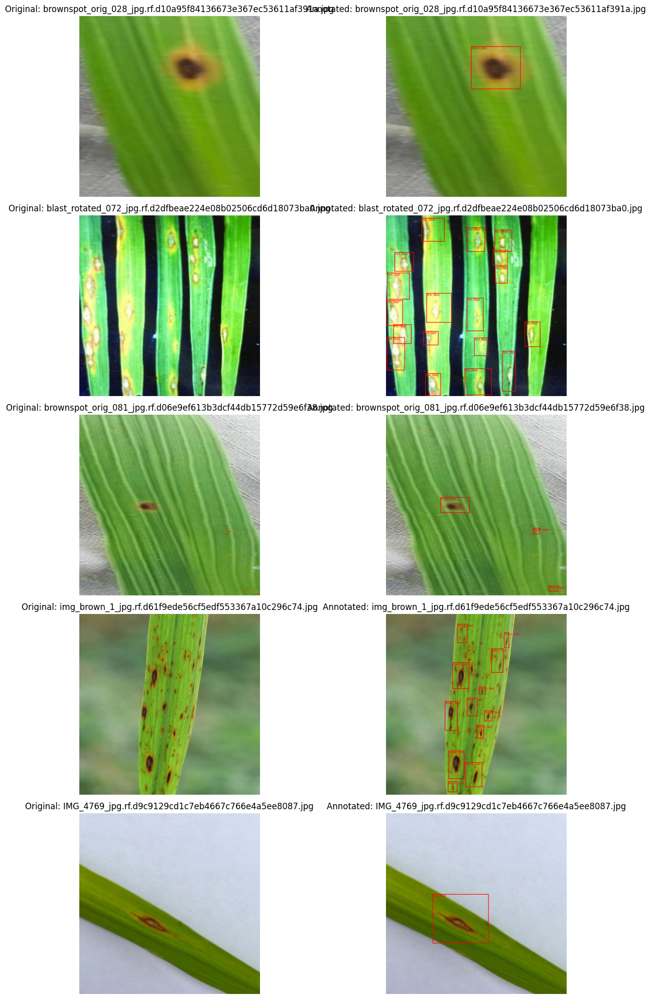

In [ ]:
# Function to display images and annotations for a specific image
def display_image_with_annotations(folder_name, image_id):
    # Find the image info
    image_info = next(img for img in coco_data[folder_name]['images'] if img['id'] == image_id)
    file_name = image_info['file_name']
    image_path = os.path.join(base_dir, folder_name, file_name)

    # Open the image
    img = Image.open(image_path)

    # Create a drawing context to draw bounding boxes
    draw = ImageDraw.Draw(img)

    # Get all annotations for the image
    image_annotations = [ann for ann in coco_data[folder_name]['annotations'] if ann['image_id'] == image_id]

    # Draw the bounding boxes and label them with class names
    for ann in image_annotations:
        category_id = ann['category_id']
        bbox = ann['bbox']
        disease_name = all_categories[category_id]

        # Draw bounding box (in COCO format, bbox = [x, y, width, height])
        x, y, width, height = bbox
        draw.rectangle([x, y, x + width, y + height], outline="red", width=2)

        # Draw label
        draw.text((x, y), disease_name, fill="red")

    return img

# Display 5 sample images with annotations from the train dataset
fig, axs = plt.subplots(5, 2, figsize=(15, 20))

for i, ax in enumerate(axs):
    # Display original image on the left
    image_info = coco_data['train']['images'][i]
    original_image_path = os.path.join(base_dir, 'train', image_info['file_name'])
    original_image = Image.open(original_image_path)
    ax[0].imshow(original_image)
    ax[0].set_title(f"Original: {image_info['file_name']}")
    ax[0].axis('off')

    # Display image with annotations on the right
    annotated_image = display_image_with_annotations('train', image_info['id'])
    ax[1].imshow(annotated_image)
    ax[1].set_title(f"Annotated: {image_info['file_name']}")
    ax[1].axis('off')

plt.tight_layout()
plt.show()

In [ ]:
# Transformation
transform = T.Compose([
    T.Resize((640, 640)),
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Load datasets using COCO format with MobileNet v3 Large FPN
train_dataset = torchvision.datasets.CocoDetection(root=os.path.join(base_dir, 'train'),
                                                  annFile=os.path.join(base_dir, 'train', '_annotations.coco.json'),
                                                  transform=transform)

valid_dataset = torchvision.datasets.CocoDetection(root=os.path.join(base_dir, 'valid'),
                                                 annFile=os.path.join(base_dir, 'valid', '_annotations.coco.json'),
                                                 transform=transform)
# Create DataLoaders
train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True, collate_fn=lambda x: tuple(zip(*x)))
valid_loader = DataLoader(valid_dataset, batch_size=4, shuffle=False, collate_fn=lambda x: tuple(zip(*x)))

loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


In [ ]:
# Load pre-trained Faster R-CNN with MobileNet v3 Large FPN
model = fasterrcnn_mobilenet_v3_large_fpn(weights='FasterRCNN_MobileNet_V3_Large_FPN_Weights.DEFAULT')

# Modify the number of classes (7 classes including background)
num_classes = 4
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
# Move model to GPU if available
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
model.to(device)

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (0): Conv2dNormActivation(
        (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (1): FrozenBatchNorm2d(16, eps=1e-05)
        (2): Hardswish()
      )
      (1): InvertedResidual(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=16, bias=False)
            (1): FrozenBatchNorm2d(16, eps=1e-05)
            (2): ReLU(inplace=True)
          )
          (1): Conv2dNormActivation(
            (0): Conv2d(16, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
            (1): FrozenBatchNorm2d(16, eps=1e-05)
          )
        )
      )
      (2): InvertedResidual(
        (block):

In [ ]:
import torch
import torch.optim as optim
from tqdm import tqdm


# Set the number of epochs
num_epochs = 10

#  Optimizer and Scheduler
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.0005, momentum=0.9, weight_decay=0.0005)
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.1)


def prepare_targets(targets):
    formatted_targets = []
    for t in targets:
        if len(t) == 0:
            print("No annotations for this image, skipping...")
            continue

        # Extract bounding boxes and check for validity
        boxes = torch.tensor([ann['bbox'] for ann in t if 'bbox' in ann], dtype=torch.float32)
        if boxes.size(0) == 0:
            print("No valid bounding boxes found for this image, skipping...")
            continue

        # Convert [x, y, width, height] -> [x_min, y_min, x_max, y_max]
        boxes[:, 2:] += boxes[:, :2]

        # Filter out invalid boxes (e.g., negative or zero-size)
        valid_boxes = []
        valid_labels = []
        for i, box in enumerate(boxes):
            x_min, y_min, x_max, y_max = box
            if (x_max > x_min) and (y_max > y_min):
                valid_boxes.append(box)
                valid_labels.append(t[i]['category_id'])
            else:
                print(f"Invalid bounding box removed: {box.tolist()}")

        if valid_boxes:
            formatted_target = {
                'boxes': torch.stack(valid_boxes),
                'labels': torch.tensor(valid_labels, dtype=torch.int64)
            }
            formatted_targets.append(formatted_target)
        else:
            print("No valid bounding boxes for this image, skipping...")

    return formatted_targets

# Debugging during DataLoader creation
def print_sample_annotations(dataset):
    for idx in range(5):  # Print the first 5 images for debugging
        img, annotations = dataset[idx]
        print(f"Image {idx} - Number of annotations: {len(annotations)}")
        for ann in annotations:
            print(f"  Annotation: {ann}")

print("Sample annotations from training dataset:")
print_sample_annotations(train_dataset)

Sample annotations from training dataset:
Image 0 - Number of annotations: 1
  Annotation: {'id': 0, 'image_id': 0, 'category_id': 2, 'bbox': [301, 107, 175, 151.5], 'area': 26512.5, 'segmentation': [], 'iscrowd': 0}
Image 1 - Number of annotations: 18
  Annotation: {'id': 1, 'image_id': 1, 'category_id': 3, 'bbox': [126, 9, 81, 83], 'area': 6723, 'segmentation': [], 'iscrowd': 0}
  Annotation: {'id': 2, 'image_id': 1, 'category_id': 3, 'bbox': [143, 275, 89.5, 104.5], 'area': 9352.75, 'segmentation': [], 'iscrowd': 0}
  Annotation: {'id': 3, 'image_id': 1, 'category_id': 3, 'bbox': [132, 410, 53.5, 49], 'area': 2621.5, 'segmentation': [], 'iscrowd': 0}
  Annotation: {'id': 4, 'image_id': 1, 'category_id': 3, 'bbox': [139, 559, 55.5, 79], 'area': 4384.5, 'segmentation': [], 'iscrowd': 0}
  Annotation: {'id': 5, 'image_id': 1, 'category_id': 3, 'bbox': [2, 431, 64, 117.5], 'area': 7520, 'segmentation': [], 'iscrowd': 0}
  Annotation: {'id': 6, 'image_id': 1, 'category_id': 3, 'bbox': [2

In [ ]:
def train_one_epoch(model, optimizer, train_loader, device, epoch):
    model.train()
    running_loss = 0.0
    progress_bar = tqdm(train_loader, desc=f"Training Epoch {epoch+1}")
    for images, targets in progress_bar:
        images = [image.to(device) for image in images]
        targets = prepare_targets(targets)
        if not targets:
            continue
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
        if len(images)!= len(targets):
            continue
        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())
        running_loss += losses.item()
        optimizer.zero_grad()
        losses.backward()
        optimizer.step()
        progress_bar.set_postfix(loss=running_loss / len(progress_bar))
    return running_loss / len(train_loader)

def evaluate(model, valid_loader, device):
    model.eval()
    running_loss = 0.0
    with torch.no_grad():
        for images, targets in tqdm(valid_loader, desc="Validating"):
            images = [image.to(device) for image in images]
            targets = prepare_targets(targets)
            if not targets:
                continue
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
            if len(images)!= len(targets):
                continue
            loss_dict = model(images, targets)
            losses = sum(loss for loss in loss_dict.values())
            running_loss += losses.item()
    return running_loss / len(valid_loader)

def train_model(model, train_loader, num_epochs, optimizer, scheduler, device):
    for epoch in range(num_epochs):
        train_loss = train_one_epoch(model, optimizer, train_loader, device, epoch)
        print(f"Epoch {epoch+1}, Loss: {train_loss}")
        scheduler.step()

# Train the model
num_epochs = 10
train_model(model, train_loader, num_epochs, optimizer, lr_scheduler, device)

Training Epoch 1: 100%|██████████| 66/66 [00:13<00:00,  4.78it/s, loss=0.721]


Epoch 1, Loss: 0.721212698654695


Training Epoch 2: 100%|██████████| 66/66 [00:10<00:00,  6.18it/s, loss=0.572]


Epoch 2, Loss: 0.572260893881321


Training Epoch 3: 100%|██████████| 66/66 [00:10<00:00,  6.21it/s, loss=0.556]


Epoch 3, Loss: 0.5563320752346155


Training Epoch 4: 100%|██████████| 66/66 [00:10<00:00,  6.17it/s, loss=0.535]


Epoch 4, Loss: 0.5346061289310455


Training Epoch 5: 100%|██████████| 66/66 [00:10<00:00,  6.17it/s, loss=0.531]


Epoch 5, Loss: 0.5314481181628776


Training Epoch 6: 100%|██████████| 66/66 [00:10<00:00,  6.13it/s, loss=0.541]


Epoch 6, Loss: 0.5413354007583676


Training Epoch 7: 100%|██████████| 66/66 [00:11<00:00,  5.96it/s, loss=0.53]


Epoch 7, Loss: 0.5296584266153249


Training Epoch 8: 100%|██████████| 66/66 [00:10<00:00,  6.06it/s, loss=0.545]


Epoch 8, Loss: 0.5445995098262122


Training Epoch 9: 100%|██████████| 66/66 [00:10<00:00,  6.03it/s, loss=0.528]


Epoch 9, Loss: 0.5283381947965333


Training Epoch 10: 100%|██████████| 66/66 [00:11<00:00,  6.00it/s, loss=0.528]

Epoch 10, Loss: 0.5283356286359556


In [ ]:
# Load test dataset using COCO format
from torchvision.datasets import CocoDetection

test_dataset = CocoDetection(root=os.path.join(base_dir, 'test'),
                             annFile=os.path.join(base_dir, 'test', '_annotations.coco.json'),
                             transform=transform)

# Create DataLoader for the test set
test_loader = DataLoader(test_dataset, batch_size=4, shuffle=False, collate_fn=lambda x: tuple(zip(*x)))


loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


In [ ]:
def evaluate_on_test(model, test_loader, device):
    model.eval()  # Set model to evaluation mode
    all_boxes = []
    all_labels = []
    all_scores = []

    with torch.no_grad():  # Disable gradient calculations for evaluation
        for images, targets in tqdm(test_loader, desc="Evaluating"):
            images = [image.to(device) for image in images]

            # Prepare targets (fixing the structure and validating bounding boxes)
            targets = prepare_targets(targets)

            # Get predictions
            predictions = model(images)

            # Collect boxes, labels, and scores for evaluation
            for i, prediction in enumerate(predictions):
                if len(prediction['boxes']) > 0:
                    all_boxes.append(prediction['boxes'].cpu())
                    all_labels.append(prediction['labels'].cpu())
                    all_scores.append(prediction['scores'].cpu())

    return all_boxes, all_labels, all_scores

In [ ]:
import numpy as np
from sklearn.metrics import average_precision_score

def compute_map(all_boxes, all_labels, all_scores, num_classes):
    y_true = np.zeros((0, num_classes))  # Initialize empty one-hot encoded array
    y_scores = np.zeros((0, num_classes))  # Initialize empty 2D scores array

    for cls in range(1, num_classes):  # start from 1 if class 0 is background
        cls_boxes = []
        cls_scores = []
        cls_labels = []

        for boxes, labels, scores in zip(all_boxes, all_labels, all_scores):
            # Ensure labels is a NumPy array
            labels = labels.numpy() if isinstance(labels, torch.Tensor) else labels

            # Create a mask for the current class
            cls_mask = (labels == cls)
            if np.any(cls_mask):  # Ensure there are samples for this class
                cls_boxes.append(boxes[cls_mask])
                cls_scores.append(scores[cls_mask])
                cls_labels.append(labels[cls_mask])

        if cls_boxes:
            cls_boxes = torch.cat(cls_boxes)
            cls_scores = torch.cat(cls_scores)

            # Convert cls_labels to tensors before concatenation
            cls_labels = torch.cat([torch.from_numpy(l) for l in cls_labels])

            # Prepare true labels in one-hot encoding
            cls_true_labels = np.zeros((len(cls_labels), num_classes))
            cls_true_labels[:, cls] = 1  # Set the corresponding class index to 1

            # Append true labels and scores
            y_true = np.vstack((y_true, cls_true_labels))

            # Convert cls_scores to 2D array where each class has its own column
            cls_score_2d = np.zeros((len(cls_scores), num_classes))
            cls_score_2d[:, cls] = cls_scores.numpy()  # Put scores in the corresponding class column
            y_scores = np.vstack((y_scores, cls_score_2d))

    # Calculate average precision for each class and then average them
    average_precisions = []
    for i in range(num_classes - 1):  # excluding background
        average_precisions.append(average_precision_score(y_true[:, i], y_scores[:, i]))

    mean_ap = np.mean(average_precisions)  # Mean Average Precision (mAP)
    return mean_ap

In [ ]:
# Evaluate on the test dataset
all_boxes, all_labels, all_scores = evaluate_on_test(model, test_loader, device)

# Compute mAP
map_score = compute_map(all_boxes, all_labels, all_scores, num_classes)
print(f"Mean Average Precision (mAP) on the test dataset: {map_score:.4f}")

Evaluating: 100%|██████████| 10/10 [00:03<00:00,  3.25it/s]Mean Average Precision (mAP) on the test dataset: 0.7233


In [ ]:
import os
import torch
import numpy as np
from torchvision.datasets import CocoDetection
from torch.utils.data import DataLoader
import torchvision.transforms as T

# Unified function to preprocess the image (same as training preprocessing)
def preprocess_image(image):
    if isinstance(image, torch.Tensor):
        return image  # If it's already a tensor, return it
    transform = T.Compose([
        T.Resize((640, 640)),  # Resize to 640x640 (same as training)
        T.ToTensor(),  # Convert image to tensor
        T.Normalize(mean=[0.485, 0.456, 0.406],  # Normalize using ImageNet mean
                    std=[0.229, 0.224, 0.225])  # Normalize using ImageNet std
    ])
    return transform(image)

# Function to compute Precision and Recall based on predicted class labels
def evaluate_precision_recall_on_dataset(model, test_loader, device, conf_threshold=0.7):
    # Initialize counts
    tp = 0  # True Positives
    fp = 0  # False Positives
    fn = 0  # False Negatives

    model.eval()  # Set model to evaluation mode

    with torch.no_grad():
        for images, annotations in test_loader:
            # Preprocess images and send to device
            images = [preprocess_image(image).to(device) for image in images]

            # Get predictions from the model
            predictions = model(images)

            # Loop over each image in the batch
            for i, prediction in enumerate(predictions):
                predicted_labels = prediction['labels'].cpu().numpy()  # Predicted class labels
                predicted_scores = prediction['scores'].cpu().numpy()  # Prediction confidence scores

                # Apply confidence threshold
                predicted_labels = predicted_labels[predicted_scores >= conf_threshold]

                gt_labels = np.array([ann['category_id'] for ann in annotations[i]])  # Ground truth labels

                # Compute TP, FP, FN based on class labels
                for pred_label in predicted_labels:
                    if pred_label in gt_labels:
                        tp += 1  # Correct class prediction
                    else:
                        fp += 1  # Incorrect class prediction

                # FN: Ground truth labels not detected by the model
                fn += len(gt_labels) - sum([1 for gt_label in gt_labels if gt_label in predicted_labels])

    # Calculate precision and recall
    precision = tp / (tp + fp) if (tp + fp) > 0 else 0.0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 0.0

    return precision, recall

# Load test dataset using COCO format
base_dir = '/content/Ninja-1'
test_dataset = CocoDetection(root=os.path.join(base_dir, 'test'),
                             annFile=os.path.join(base_dir, 'test', '_annotations.coco.json'))

# Create DataLoader for test dataset
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False, collate_fn=lambda x: tuple(zip(*x)))
# Set device (CPU or CUDA)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Adjust confidence threshold as needed
confidence_threshold = 0.5  # You can adjust this value

# Evaluate the model on the test dataset for Precision and Recall
precision, recall = evaluate_precision_recall_on_dataset(model, test_loader, device, conf_threshold=confidence_threshold)

# Convert to percentages
precision_percentage = precision * 100
recall_percentage = recall * 100

print(f"Precision (P%): {precision_percentage:.2f}%")
print(f"Recall (R%): {recall_percentage:.2f}%")


loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
Precision (P%): 79.84%
Recall (R%): 76.77%


In [ ]:
torch.save(model, 'faster_rcnn_MobileNet_v3_Large.pt')

In [ ]:
model = torch.load('faster_rcnn_MobileNet_v3_Large.pt')
model.eval()


You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (0): Conv2dNormActivation(
        (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (1): FrozenBatchNorm2d(16, eps=1e-05)
        (2): Hardswish()
      )
      (1): InvertedResidual(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=16, bias=False)
            (1): FrozenBatchNorm2d(16, eps=1e-05)
            (2): ReLU(inplace=True)
          )
          (1): Conv2dNormActivation(
            (0): Conv2d(16, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
            (1): FrozenBatchNorm2d(16, eps=1e-05)
          )
        )
      )
      (2): InvertedResidual(
        (block):

# **Faster RCNN with Densenet121**

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="3yeDfLL9a4WwAyvMETBG")
project = rf.workspace("harsha-etczl").project("rice-leaf-disease-pnczf")
version = project.version(1)
dataset = version.download("coco")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.9/80.9 kB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 5.4 MB/s eta 0:00:00
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Rice-leaf-disease-1 in coco:: 100%|██████████| 3686/3686 [00:01<00:00, 2026.60it/s]


In [ ]:
import os
import json
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw
import collections
import torch
import torchvision
from torchvision.models.detection import FasterRCNN, fasterrcnn_mobilenet_v3_large_fpn
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision import transforms as T
from torch.utils.data import DataLoader
from tqdm import tqdm

# Define the path to the base directory where train, valid, test folders are stored
base_dir = '/content/Ninja-1'

# Folders to check
folders = ['train', 'valid', 'test']

# Initialize categories to keep track of categories across all datasets
all_categories = {}
coco_data = {}

# Function to load and check annotation files
def check_annotations(folder_name):
    annotation_file = os.path.join(base_dir, folder_name, '_annotations.coco.json')

    if os.path.exists(annotation_file):
        print(f"\nChecking annotations for the {folder_name} folder:")
        with open(annotation_file, 'r') as f:
            coco_data[folder_name] = json.load(f)

        # Print an overview of the annotations
        print("Categories: ", coco_data[folder_name].get('categories', 'No categories found'))
        print("Number of Images: ", len(coco_data[folder_name].get('images', [])))
        print("Number of Annotations: ", len(coco_data[folder_name].get('annotations', [])))

        # Add categories to the global dictionary
        for category in coco_data[folder_name]['categories']:
            all_categories[category['id']] = category['name']

        # Check if 'image_id', 'category_id', and 'bbox' fields are present in annotations
        if coco_data[folder_name].get('annotations'):
            for annotation in coco_data[folder_name]['annotations'][:5]:  # Print first 5 annotations as a sample
                print("Annotation example: ", annotation)
                assert 'image_id' in annotation, "Missing 'image_id' in annotation"
                assert 'category_id' in annotation, "Missing 'category_id' in annotation"
                assert 'bbox' in annotation, "Missing 'bbox' in annotation"
        else:
            print(f"No annotations found in {folder_name}!")
    else:
        print(f"Annotation file not found in {folder_name} folder")

# Check annotations for all folders: train, valid, test
for folder in folders:
    check_annotations(folder)


Checking annotations for the train folder:
Categories:  [{'id': 0, 'name': 'leaf', 'supercategory': 'none'}, {'id': 1, 'name': 'Bacterial_Blight', 'supercategory': 'leaf'}, {'id': 2, 'name': 'Brown_Spot', 'supercategory': 'leaf'}, {'id': 3, 'name': 'Rice_Blast', 'supercategory': 'leaf'}]
Number of Images:  261
Number of Annotations:  1041
Annotation example:  {'id': 0, 'image_id': 0, 'category_id': 2, 'bbox': [301, 107, 175, 151.5], 'area': 26512.5, 'segmentation': [], 'iscrowd': 0}
Annotation example:  {'id': 1, 'image_id': 1, 'category_id': 3, 'bbox': [126, 9, 81, 83], 'area': 6723, 'segmentation': [], 'iscrowd': 0}
Annotation example:  {'id': 2, 'image_id': 1, 'category_id': 3, 'bbox': [143, 275, 89.5, 104.5], 'area': 9352.75, 'segmentation': [], 'iscrowd': 0}
Annotation example:  {'id': 3, 'image_id': 1, 'category_id': 3, 'bbox': [132, 410, 53.5, 49], 'area': 2621.5, 'segmentation': [], 'iscrowd': 0}
Annotation example:  {'id': 4, 'image_id': 1, 'category_id': 3, 'bbox': [139, 559

In [ ]:
# Extract category names from the aggregated categories
print("\nAll Disease categories across datasets: ", all_categories)


All Disease categories across datasets:  {0: 'leaf', 1: 'Bacterial_Blight', 2: 'Brown_Spot', 3: 'Rice_Blast'}


In [ ]:
# Transformation
transform = T.Compose([
    T.Resize((640, 640)),
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Load datasets using COCO format with MobileNet v3 Large FPN
train_dataset = torchvision.datasets.CocoDetection(root=os.path.join(base_dir, 'train'),
                                                  annFile=os.path.join(base_dir, 'train', '_annotations.coco.json'),
                                                  transform=transform)

valid_dataset = torchvision.datasets.CocoDetection(root=os.path.join(base_dir, 'valid'),
                                                 annFile=os.path.join(base_dir, 'valid', '_annotations.coco.json'),
                                                 transform=transform)
# Create DataLoaders
train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True, collate_fn=lambda x: tuple(zip(*x)))
valid_loader = DataLoader(valid_dataset, batch_size=4, shuffle=False, collate_fn=lambda x: tuple(zip(*x)))

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


In [ ]:
import torch
from torchvision.models.detection import FasterRCNN
from torchvision.models.detection.rpn import AnchorGenerator
from torchvision.models import densenet121
from torch.utils.data import DataLoader
from torchvision.transforms import functional as F
import torchvision.transforms as T
from torchvision.datasets.coco import CocoDetection

# Load the pretrained DenseNet model
densenet = densenet121(weights="DenseNet121_Weights.DEFAULT")

# Use the features (up to the last convolutional layer) as the backbone
backbone = torch.nn.Sequential(*list(densenet.features.children()))

# Freeze the backbone (optional: depends on whether you want to fine-tune it)
for param in backbone.parameters():
    param.requires_grad = False

# Add a layer to adapt the output channels of DenseNet's feature extractor
# Faster R-CNN expects an output feature size of 7x7; DenseNet has 1024 channels
backbone.out_channels = 1024

# Define the Anchor Generator
# The sizes and aspect ratios here are examples; adjust as needed for your dataset
anchor_generator = AnchorGenerator(
    sizes=((32, 64, 128, 256, 512),),
    aspect_ratios=((0.5, 1.0, 2.0),)
)

# Define the ROI Pooler
roi_pooler = torchvision.ops.MultiScaleRoIAlign(
    featmap_names=['0'],  # Specify the feature map names
    output_size=7,        # Pooling to 7x7
    sampling_ratio=2
)

# Define the Faster R-CNN model
model = FasterRCNN(
    backbone,
    num_classes=4,  # Adjust for your dataset (6 classes + background)
    rpn_anchor_generator=anchor_generator,
    box_roi_pool=roi_pooler
)

# Move the model to the appropriate device
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
model.to(device)

# Display the model structure for debugging
print(model)

Downloading: "https://download.pytorch.org/models/densenet121-a639ec97.pth" to /root/.cache/torch/hub/checkpoints/densenet121-a639ec97.pth
100%|██████████| 30.8M/30.8M [00:00<00:00, 80.3MB/s]


FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): _DenseBlock(
      (denselayer1): _DenseLayer(
        (norm1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu1): ReLU(inplace=True)
        (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (norm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu2): ReLU(inplace=True)
        (conv2): Conv2d(128, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False

In [ ]:
import torch
import torch.optim as optim
from tqdm import tqdm


# Set the number of epochs
num_epochs = 10

#  Optimizer and Scheduler
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.0005, momentum=0.9, weight_decay=0.0005)
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.1)


def prepare_targets(targets):
    formatted_targets = []
    for t in targets:
        if len(t) == 0:
            print("No annotations for this image, skipping...")
            continue

        # Extract bounding boxes and check for validity
        boxes = torch.tensor([ann['bbox'] for ann in t if 'bbox' in ann], dtype=torch.float32)
        if boxes.size(0) == 0:
            print("No valid bounding boxes found for this image, skipping...")
            continue

        # Convert [x, y, width, height] -> [x_min, y_min, x_max, y_max]
        boxes[:, 2:] += boxes[:, :2]

        # Filter out invalid boxes (e.g., negative or zero-size)
        valid_boxes = []
        valid_labels = []
        for i, box in enumerate(boxes):
            x_min, y_min, x_max, y_max = box
            if (x_max > x_min) and (y_max > y_min):
                valid_boxes.append(box)
                valid_labels.append(t[i]['category_id'])
            else:
                print(f"Invalid bounding box removed: {box.tolist()}")

        if valid_boxes:
            formatted_target = {
                'boxes': torch.stack(valid_boxes),
                'labels': torch.tensor(valid_labels, dtype=torch.int64)
            }
            formatted_targets.append(formatted_target)
        else:
            print("No valid bounding boxes for this image, skipping...")

    return formatted_targets

# Debugging during DataLoader creation
def print_sample_annotations(dataset):
    for idx in range(5):  # Print the first 5 images for debugging
        img, annotations = dataset[idx]
        print(f"Image {idx} - Number of annotations: {len(annotations)}")
        for ann in annotations:
            print(f"  Annotation: {ann}")

print("Sample annotations from training dataset:")
print_sample_annotations(train_dataset)

Sample annotations from training dataset:
Image 0 - Number of annotations: 1
  Annotation: {'id': 0, 'image_id': 0, 'category_id': 2, 'bbox': [301, 107, 175, 151.5], 'area': 26512.5, 'segmentation': [], 'iscrowd': 0}
Image 1 - Number of annotations: 18
  Annotation: {'id': 1, 'image_id': 1, 'category_id': 3, 'bbox': [126, 9, 81, 83], 'area': 6723, 'segmentation': [], 'iscrowd': 0}
  Annotation: {'id': 2, 'image_id': 1, 'category_id': 3, 'bbox': [143, 275, 89.5, 104.5], 'area': 9352.75, 'segmentation': [], 'iscrowd': 0}
  Annotation: {'id': 3, 'image_id': 1, 'category_id': 3, 'bbox': [132, 410, 53.5, 49], 'area': 2621.5, 'segmentation': [], 'iscrowd': 0}
  Annotation: {'id': 4, 'image_id': 1, 'category_id': 3, 'bbox': [139, 559, 55.5, 79], 'area': 4384.5, 'segmentation': [], 'iscrowd': 0}
  Annotation: {'id': 5, 'image_id': 1, 'category_id': 3, 'bbox': [2, 431, 64, 117.5], 'area': 7520, 'segmentation': [], 'iscrowd': 0}
  Annotation: {'id': 6, 'image_id': 1, 'category_id': 3, 'bbox': [2

In [ ]:
def train_one_epoch(model, optimizer, train_loader, device, epoch):
    model.train()
    running_loss = 0.0
    progress_bar = tqdm(train_loader, desc=f"Training Epoch {epoch+1}")
    for images, targets in progress_bar:
        images = [image.to(device) for image in images]
        targets = prepare_targets(targets)
        if not targets:
            continue
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
        if len(images)!= len(targets):
            continue
        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())
        running_loss += losses.item()
        optimizer.zero_grad()
        losses.backward()
        optimizer.step()
        progress_bar.set_postfix(loss=running_loss / len(progress_bar))
    return running_loss / len(train_loader)

def evaluate(model, valid_loader, device):
    model.eval()
    running_loss = 0.0
    with torch.no_grad():
        for images, targets in tqdm(valid_loader, desc="Validating"):
            images = [image.to(device) for image in images]
            targets = prepare_targets(targets)
            if not targets:
                continue
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
            if len(images)!= len(targets):
                continue
            loss_dict = model(images, targets)
            losses = sum(loss for loss in loss_dict.values())
            running_loss += losses.item()
    return running_loss / len(valid_loader)

def train_model(model, train_loader, num_epochs, optimizer, scheduler, device):
    for epoch in range(num_epochs):
        train_loss = train_one_epoch(model, optimizer, train_loader, device, epoch)
        print(f"Epoch {epoch+1}, Loss: {train_loss}")
        scheduler.step()

# Train the model
num_epochs = 10
train_model(model, train_loader, num_epochs, optimizer, lr_scheduler, device)

Training Epoch 1: 100%|██████████| 66/66 [00:25<00:00,  2.55it/s, loss=0.866]


Epoch 1, Loss: 0.866188516219457


Training Epoch 2: 100%|██████████| 66/66 [00:22<00:00,  2.90it/s, loss=0.389]


Epoch 2, Loss: 0.3893660776542895


Training Epoch 3: 100%|██████████| 66/66 [00:24<00:00,  2.75it/s, loss=0.319]


Epoch 3, Loss: 0.31930208386796893


Training Epoch 4: 100%|██████████| 66/66 [00:23<00:00,  2.79it/s, loss=0.306]


Epoch 4, Loss: 0.30573317792379495


Training Epoch 5: 100%|██████████| 66/66 [00:23<00:00,  2.85it/s, loss=0.301]


Epoch 5, Loss: 0.30125129448645044


Training Epoch 6: 100%|██████████| 66/66 [00:23<00:00,  2.82it/s, loss=0.297]


Epoch 6, Loss: 0.2969656162189715


Training Epoch 7: 100%|██████████| 66/66 [00:23<00:00,  2.83it/s, loss=0.299]


Epoch 7, Loss: 0.2990445386279713


Training Epoch 8: 100%|██████████| 66/66 [00:23<00:00,  2.78it/s, loss=0.297]


Epoch 8, Loss: 0.2972679975809473


Training Epoch 9: 100%|██████████| 66/66 [00:23<00:00,  2.84it/s, loss=0.298]


Epoch 9, Loss: 0.29774433396982425


Training Epoch 10: 100%|██████████| 66/66 [00:23<00:00,  2.84it/s, loss=0.298]

Epoch 10, Loss: 0.29839802714008273


In [ ]:
# Load test dataset using COCO format
from torchvision.datasets import CocoDetection

test_dataset = CocoDetection(root=os.path.join(base_dir, 'test'),
                             annFile=os.path.join(base_dir, 'test', '_annotations.coco.json'),
                             transform=transform)

# Create DataLoader for the test set
test_loader = DataLoader(test_dataset, batch_size=4, shuffle=False, collate_fn=lambda x: tuple(zip(*x)))


loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


In [ ]:
def evaluate_on_test(model, test_loader, device):
    model.eval()  # Set model to evaluation mode
    all_boxes = []
    all_labels = []
    all_scores = []

    with torch.no_grad():  # Disable gradient calculations for evaluation
        for images, targets in tqdm(test_loader, desc="Evaluating"):
            images = [image.to(device) for image in images]

            # Prepare targets (fixing the structure and validating bounding boxes)
            targets = prepare_targets(targets)

            # Get predictions
            predictions = model(images)

            # Collect boxes, labels, and scores for evaluation
            for i, prediction in enumerate(predictions):
                if len(prediction['boxes']) > 0:
                    all_boxes.append(prediction['boxes'].cpu())
                    all_labels.append(prediction['labels'].cpu())
                    all_scores.append(prediction['scores'].cpu())

    return all_boxes, all_labels, all_scores

In [ ]:
import numpy as np
from sklearn.metrics import average_precision_score

def compute_map(all_boxes, all_labels, all_scores, num_classes):
    y_true = np.zeros((0, num_classes))  # Initialize empty one-hot encoded array
    y_scores = np.zeros((0, num_classes))  # Initialize empty 2D scores array

    for cls in range(1, num_classes):  # start from 1 if class 0 is background
        cls_boxes = []
        cls_scores = []
        cls_labels = []

        for boxes, labels, scores in zip(all_boxes, all_labels, all_scores):
            # Ensure labels is a NumPy array
            labels = labels.numpy() if isinstance(labels, torch.Tensor) else labels

            # Create a mask for the current class
            cls_mask = (labels == cls)
            if np.any(cls_mask):  # Ensure there are samples for this class
                cls_boxes.append(boxes[cls_mask])
                cls_scores.append(scores[cls_mask])
                cls_labels.append(labels[cls_mask])

        if cls_boxes:
            cls_boxes = torch.cat(cls_boxes)
            cls_scores = torch.cat(cls_scores)

            # Convert cls_labels to tensors before concatenation
            cls_labels = torch.cat([torch.from_numpy(l) for l in cls_labels])

            # Prepare true labels in one-hot encoding
            cls_true_labels = np.zeros((len(cls_labels), num_classes))
            cls_true_labels[:, cls] = 1  # Set the corresponding class index to 1

            # Append true labels and scores
            y_true = np.vstack((y_true, cls_true_labels))

            # Convert cls_scores to 2D array where each class has its own column
            cls_score_2d = np.zeros((len(cls_scores), num_classes))
            cls_score_2d[:, cls] = cls_scores.numpy()  # Put scores in the corresponding class column
            y_scores = np.vstack((y_scores, cls_score_2d))

    # Calculate average precision for each class and then average them
    average_precisions = []
    for i in range(num_classes - 1):  # excluding background
        average_precisions.append(average_precision_score(y_true[:, i], y_scores[:, i]))

    mean_ap = np.mean(average_precisions)  # Mean Average Precision (mAP)
    return mean_ap

In [ ]:
# Evaluate on the test dataset
all_boxes, all_labels, all_scores = evaluate_on_test(model, test_loader, device)

# Define num_classes (assuming you have 4 classes including background)
num_classes = 4

# Compute mAP
map_score = compute_map(all_boxes, all_labels, all_scores, num_classes)
print(f"Mean Average Precision (mAP) on the test dataset: {map_score:.4f}")


Evaluating: 100%|██████████| 10/10 [00:03<00:00,  3.25it/s]Mean Average Precision (mAP) on the test dataset: 0.6667


In [ ]:
import os
import torch
import numpy as np
from torchvision.datasets import CocoDetection
from torch.utils.data import DataLoader
import torchvision.transforms as T

# Unified function to preprocess the image (same as training preprocessing)
def preprocess_image(image):
    if isinstance(image, torch.Tensor):
        return image  # If it's already a tensor, return it
    transform = T.Compose([
        T.Resize((640, 640)),  # Resize to 640x640 (same as training)
        T.ToTensor(),  # Convert image to tensor
        T.Normalize(mean=[0.485, 0.456, 0.406],  # Normalize using ImageNet mean
                    std=[0.229, 0.224, 0.225])  # Normalize using ImageNet std
    ])
    return transform(image)

# Function to compute Precision and Recall based on predicted class labels
def evaluate_precision_recall_on_dataset(model, test_loader, device, conf_threshold=0.7):
    # Initialize counts
    tp = 0  # True Positives
    fp = 0  # False Positives
    fn = 0  # False Negatives

    model.eval()  # Set model to evaluation mode

    with torch.no_grad():
        for images, annotations in test_loader:
            # Preprocess images and send to device
            images = [preprocess_image(image).to(device) for image in images]

            # Get predictions from the model
            predictions = model(images)

            # Loop over each image in the batch
            for i, prediction in enumerate(predictions):
                predicted_labels = prediction['labels'].cpu().numpy()  # Predicted class labels
                predicted_scores = prediction['scores'].cpu().numpy()  # Prediction confidence scores

                # Apply confidence threshold
                predicted_labels = predicted_labels[predicted_scores >= conf_threshold]

                gt_labels = np.array([ann['category_id'] for ann in annotations[i]])  # Ground truth labels

                # Compute TP, FP, FN based on class labels
                for pred_label in predicted_labels:
                    if pred_label in gt_labels:
                        tp += 1  # Correct class prediction
                    else:
                        fp += 1  # Incorrect class prediction

                # FN: Ground truth labels not detected by the model
                fn += len(gt_labels) - sum([1 for gt_label in gt_labels if gt_label in predicted_labels])

    # Calculate precision and recall
    precision = tp / (tp + fp) if (tp + fp) > 0 else 0.0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 0.0

    return precision, recall

# Load test dataset using COCO format
base_dir = '/content/Ninja-1'
test_dataset = CocoDetection(root=os.path.join(base_dir, 'test'),
                             annFile=os.path.join(base_dir, 'test', '_annotations.coco.json'))

# Create DataLoader for test dataset
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False, collate_fn=lambda x: tuple(zip(*x)))
# Set device (CPU or CUDA)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Adjust confidence threshold as needed
confidence_threshold = 0.2  # You can adjust this value

# Evaluate the model on the test dataset for Precision and Recall
precision, recall = evaluate_precision_recall_on_dataset(model, test_loader, device, conf_threshold=confidence_threshold)

# Convert to percentages
precision_percentage = precision * 100
recall_percentage = recall * 100

print(f"Precision (P%): {precision_percentage:.2f}%")
print(f"Recall (R%): {recall_percentage:.2f}%")


loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
Precision (P%): 73.24%
Recall (R%): 56.83%


In [ ]:
torch.save(model, 'faster_rcnn_Dense121.pt')

In [ ]:
model = torch.load('faster_rcnn_Dense121.pt')
model.eval()


You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): _DenseBlock(
      (denselayer1): _DenseLayer(
        (norm1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu1): ReLU(inplace=True)
        (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (norm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu2): ReLU(inplace=True)
        (conv2): Conv2d(128, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


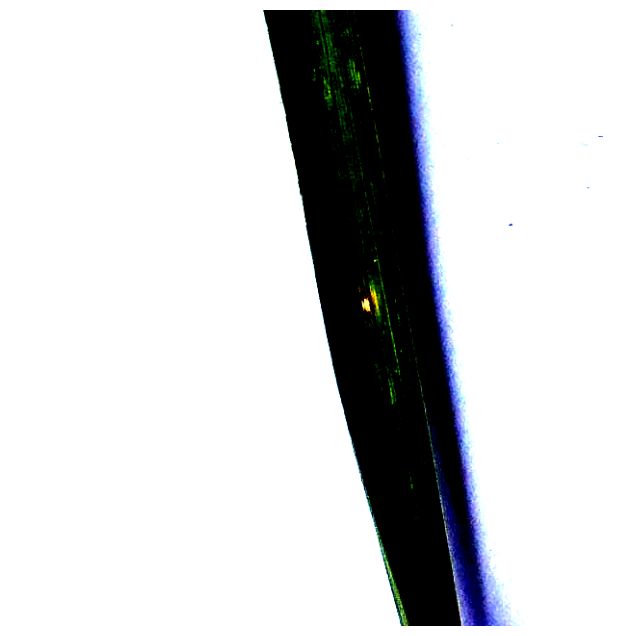

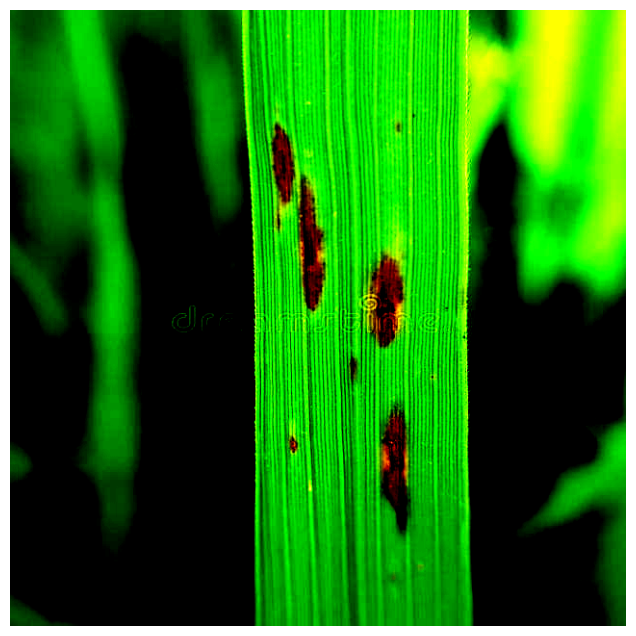

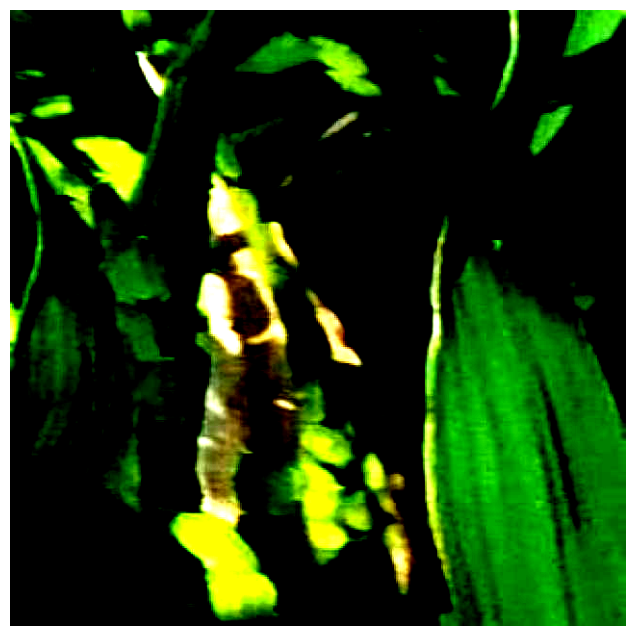

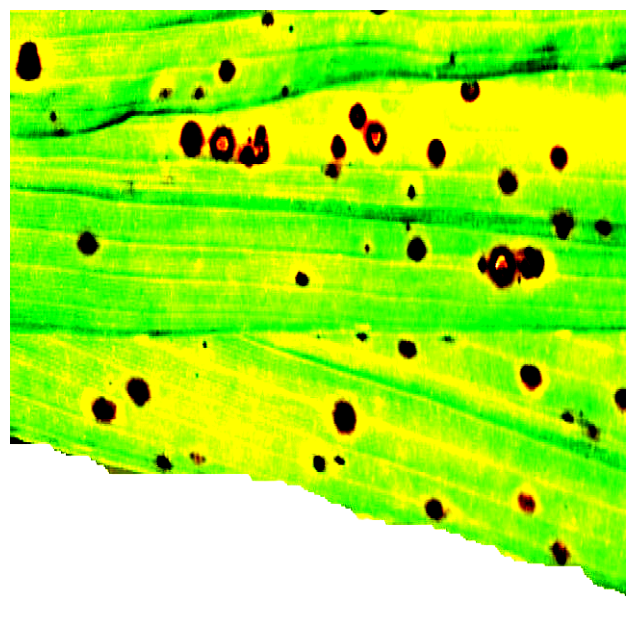

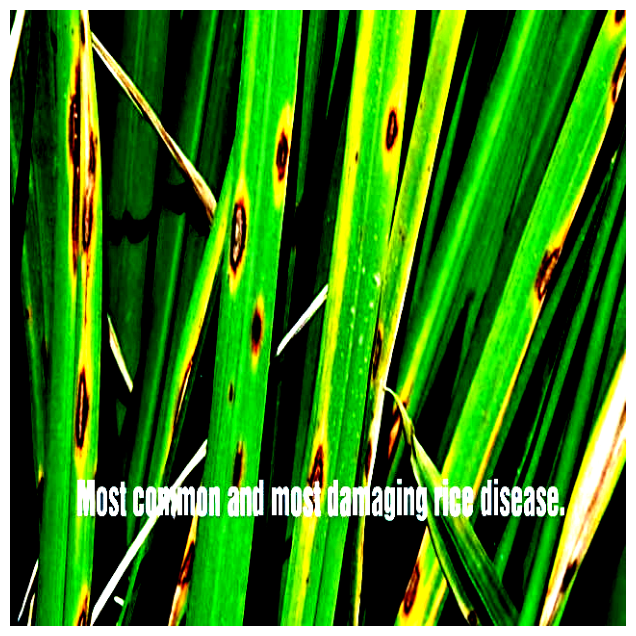

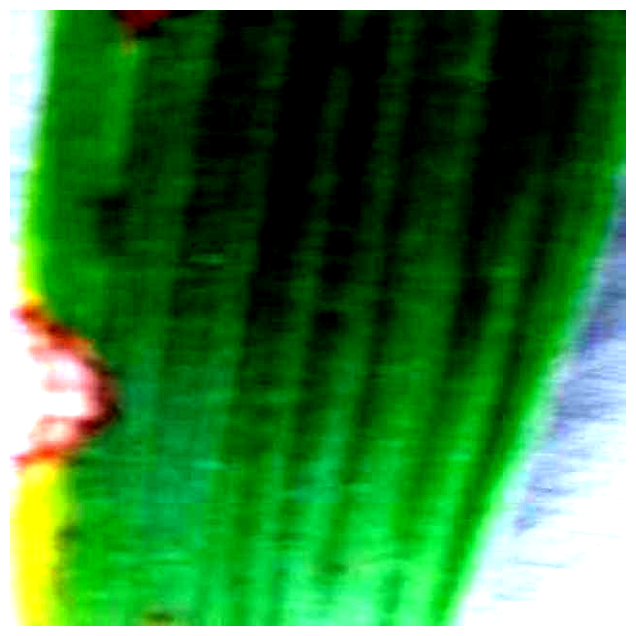

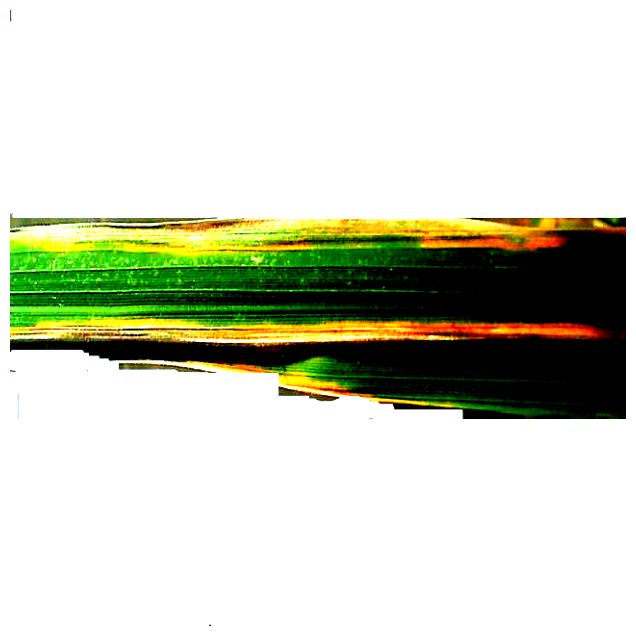

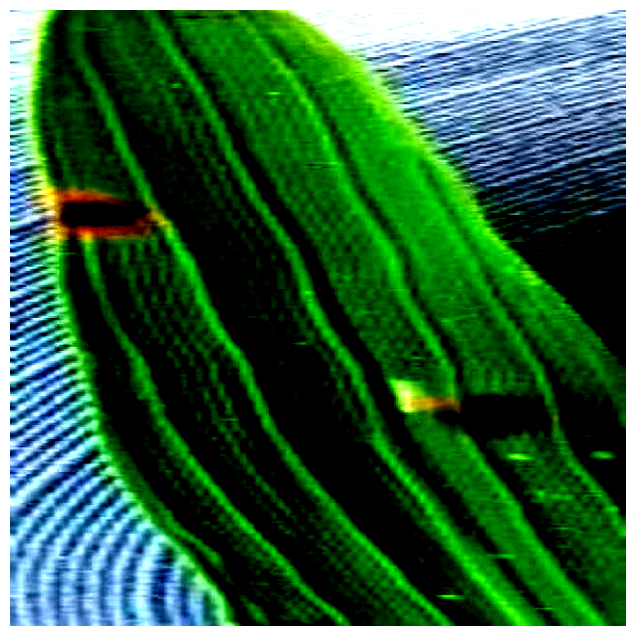

In [ ]:
import torch
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
class_names = {0: 'leaf', 1: 'Bacterial_Blight', 2: 'Brown_Spot', 3: 'Rice_Blast'}  # Update with your actual class names

# Unified function to preprocess the image (same as training preprocessing)
def preprocess_image(image, device): #added device as an argument
    if isinstance(image, torch.Tensor):
        return image  # If it's already a tensor, return it
    transform = T.Compose([
        T.Resize((640, 640)),  # Resize to 640x640 (same as training)
        T.ToTensor(),  # Convert image to tensor
        T.Normalize(mean=[0.485, 0.456, 0.406],  # Normalize using ImageNet mean
                    std=[0.229, 0.224, 0.225])  # Normalize using ImageNet std
    ])
    return transform(image).to(device) #move tensor to the device

# Function to visualize predictions
def visualize_predictions(images, predictions, class_names, num_samples=8):
    for i in range(num_samples):
        # Get the original image
        image = images[i].permute(1, 2, 0).cpu().numpy()  # Convert to HWC format

        # Draw predicted boxes
        boxes = predictions[i]['boxes'].cpu().detach().numpy()  # Use detach to avoid tracking gradients
        labels = predictions[i]['labels'].cpu().detach().numpy()
        scores = predictions[i]['scores'].cpu().detach().numpy()

        # Display the image
        plt.figure(figsize=(12, 8))
        plt.imshow(image)

        for box, label, score in zip(boxes, labels, scores):
            if score > 0.5:  # Show boxes with a score above a certain threshold
                x_min, y_min, x_max, y_max = box  # Adjust based on your box format
                rect = plt.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min,
                                     fill=False, color='red', linewidth=2)
                plt.gca().add_patch(rect)
                # Replace label with class name
                class_name = class_names[int(label)]
                plt.text(x_min, y_min, f'{class_name}, Score: {score:.2f}',
                         color='white', fontsize=12, bbox=dict(facecolor='red', alpha=0.5))

        plt.axis('off')
        plt.show()

# Function to evaluate and get predictions from the model
def get_predictions(model, data_loader, device):
    model.eval()
    all_images = []
    all_predictions = []

    with torch.no_grad():
        for images, _ in data_loader:  # Get only images, ignore targets
            # Preprocess and send to device here
            images = [preprocess_image(img, device) for img in images]
            predictions = model(images)  # Forward pass
            all_images.extend(images)
            all_predictions.extend(predictions)

    return all_images, all_predictions

# Load the Faster R-CNN model
model_path = '/content/faster_rcnn_Dense121.pt'
model = torch.load(model_path)  # Directly load the model
model.eval()

# Set device (CPU or CUDA)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Get predictions
all_images, all_predictions = get_predictions(model, test_loader, device)

# Visualize the results
visualize_predictions(all_images, all_predictions, class_names, num_samples=8)

# **Faster RCNN with Resnet-50**

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="3yeDfLL9a4WwAyvMETBG")
project = rf.workspace("harsha-etczl").project("rice-leaf-disease-pnczf")
version = project.version(1)
dataset = version.download("coco")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.9/80.9 kB 6.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 5.3 MB/s eta 0:00:00
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Rice-leaf-disease-1 in coco:: 100%|██████████| 3686/3686 [00:00<00:00, 6221.09it/s]


In [ ]:
import os
import json
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw
import collections
import torch
import torchvision
from torchvision.models.detection import FasterRCNN, fasterrcnn_mobilenet_v3_large_fpn
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision import transforms as T
from torch.utils.data import DataLoader
from tqdm import tqdm

# Define the path to the base directory where train, valid, test folders are stored
base_dir = '/content/Ninja-1'

# Folders to check
folders = ['train', 'valid', 'test']

# Initialize categories to keep track of categories across all datasets
all_categories = {}
coco_data = {}

# Function to load and check annotation files
def check_annotations(folder_name):
    annotation_file = os.path.join(base_dir, folder_name, '_annotations.coco.json')

    if os.path.exists(annotation_file):
        print(f"\nChecking annotations for the {folder_name} folder:")
        with open(annotation_file, 'r') as f:
            coco_data[folder_name] = json.load(f)

        # Print an overview of the annotations
        print("Categories: ", coco_data[folder_name].get('categories', 'No categories found'))
        print("Number of Images: ", len(coco_data[folder_name].get('images', [])))
        print("Number of Annotations: ", len(coco_data[folder_name].get('annotations', [])))

        # Add categories to the global dictionary
        for category in coco_data[folder_name]['categories']:
            all_categories[category['id']] = category['name']

        # Check if 'image_id', 'category_id', and 'bbox' fields are present in annotations
        if coco_data[folder_name].get('annotations'):
            for annotation in coco_data[folder_name]['annotations'][:5]:  # Print first 5 annotations as a sample
                print("Annotation example: ", annotation)
                assert 'image_id' in annotation, "Missing 'image_id' in annotation"
                assert 'category_id' in annotation, "Missing 'category_id' in annotation"
                assert 'bbox' in annotation, "Missing 'bbox' in annotation"
        else:
            print(f"No annotations found in {folder_name}!")
    else:
        print(f"Annotation file not found in {folder_name} folder")

# Check annotations for all folders: train, valid, test
for folder in folders:
    check_annotations(folder)


Checking annotations for the train folder:
Categories:  [{'id': 0, 'name': 'leaf', 'supercategory': 'none'}, {'id': 1, 'name': 'Bacterial_Blight', 'supercategory': 'leaf'}, {'id': 2, 'name': 'Brown_Spot', 'supercategory': 'leaf'}, {'id': 3, 'name': 'Rice_Blast', 'supercategory': 'leaf'}]
Number of Images:  261
Number of Annotations:  1041
Annotation example:  {'id': 0, 'image_id': 0, 'category_id': 2, 'bbox': [301, 107, 175, 151.5], 'area': 26512.5, 'segmentation': [], 'iscrowd': 0}
Annotation example:  {'id': 1, 'image_id': 1, 'category_id': 3, 'bbox': [126, 9, 81, 83], 'area': 6723, 'segmentation': [], 'iscrowd': 0}
Annotation example:  {'id': 2, 'image_id': 1, 'category_id': 3, 'bbox': [143, 275, 89.5, 104.5], 'area': 9352.75, 'segmentation': [], 'iscrowd': 0}
Annotation example:  {'id': 3, 'image_id': 1, 'category_id': 3, 'bbox': [132, 410, 53.5, 49], 'area': 2621.5, 'segmentation': [], 'iscrowd': 0}
Annotation example:  {'id': 4, 'image_id': 1, 'category_id': 3, 'bbox': [139, 559

In [ ]:
# Extract category names from the aggregated categories
print("\nAll Disease categories across datasets: ", all_categories)


All Disease categories across datasets:  {0: 'leaf', 1: 'Bacterial_Blight', 2: 'Brown_Spot', 3: 'Rice_Blast'}


In [ ]:
# Transformation
transform = T.Compose([
    T.Resize((640, 640)),
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Load datasets using COCO format with MobileNet v3 Large FPN
train_dataset = torchvision.datasets.CocoDetection(root=os.path.join(base_dir, 'train'),
                                                  annFile=os.path.join(base_dir, 'train', '_annotations.coco.json'),
                                                  transform=transform)

valid_dataset = torchvision.datasets.CocoDetection(root=os.path.join(base_dir, 'valid'),
                                                 annFile=os.path.join(base_dir, 'valid', '_annotations.coco.json'),
                                                 transform=transform)
# Create DataLoaders
train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True, collate_fn=lambda x: tuple(zip(*x)))
valid_loader = DataLoader(valid_dataset, batch_size=4, shuffle=False, collate_fn=lambda x: tuple(zip(*x)))

loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


In [ ]:
# Import the necessary libraries
import torchvision
from torchvision.models.detection import fasterrcnn_resnet50_fpn
import torch
import torch.optim as optim
from tqdm import tqdm
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection import FasterRCNN

# Modify the number of classes (7 classes including background)
num_classes = 4

# Load pretrained Faster R-CNN model
model = fasterrcnn_resnet50_fpn(weights='FasterRCNN_ResNet50_FPN_Weights.DEFAULT')

in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

# Move model to GPU if available
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
model.to(device)

Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth
100%|██████████| 160M/160M [00:01<00:00, 161MB/s]


FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

In [ ]:
import torch
import torch.optim as optim
from tqdm import tqdm


# Set the number of epochs
num_epochs = 10

#  Optimizer and Scheduler
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.001, momentum=0.9, weight_decay=0.0005)
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.1)

def prepare_targets(targets):
    formatted_targets = []
    for t in targets:
        if len(t) == 0:
            print("No annotations for this image, skipping...")
            continue

        # Extract bounding boxes and check for validity
        boxes = torch.tensor([ann['bbox'] for ann in t if 'bbox' in ann], dtype=torch.float32)
        if boxes.size(0) == 0:
            print("No valid bounding boxes found for this image, skipping...")
            continue

        # Convert [x, y, width, height] -> [x_min, y_min, x_max, y_max]
        boxes[:, 2:] += boxes[:, :2]

        # Filter out invalid boxes (e.g., negative or zero-size)
        valid_boxes = []
        valid_labels = []
        for i, box in enumerate(boxes):
            x_min, y_min, x_max, y_max = box
            if (x_max > x_min) and (y_max > y_min):
                valid_boxes.append(box)
                valid_labels.append(t[i]['category_id'])
            else:
                print(f"Invalid bounding box removed: {box.tolist()}")

        if valid_boxes:
            formatted_target = {
                'boxes': torch.stack(valid_boxes),
                'labels': torch.tensor(valid_labels, dtype=torch.int64)
            }
            formatted_targets.append(formatted_target)
        else:
            print("No valid bounding boxes for this image, skipping...")

    return formatted_targets

# Debugging during DataLoader creation
def print_sample_annotations(dataset):
    for idx in range(5):  # Print the first 5 images for debugging
        img, annotations = dataset[idx]
        print(f"Image {idx} - Number of annotations: {len(annotations)}")
        for ann in annotations:
            print(f"  Annotation: {ann}")

print("Sample annotations from training dataset:")
print_sample_annotations(train_dataset)

Sample annotations from training dataset:
Image 0 - Number of annotations: 1
  Annotation: {'id': 0, 'image_id': 0, 'category_id': 2, 'bbox': [301, 107, 175, 151.5], 'area': 26512.5, 'segmentation': [], 'iscrowd': 0}
Image 1 - Number of annotations: 18
  Annotation: {'id': 1, 'image_id': 1, 'category_id': 3, 'bbox': [126, 9, 81, 83], 'area': 6723, 'segmentation': [], 'iscrowd': 0}
  Annotation: {'id': 2, 'image_id': 1, 'category_id': 3, 'bbox': [143, 275, 89.5, 104.5], 'area': 9352.75, 'segmentation': [], 'iscrowd': 0}
  Annotation: {'id': 3, 'image_id': 1, 'category_id': 3, 'bbox': [132, 410, 53.5, 49], 'area': 2621.5, 'segmentation': [], 'iscrowd': 0}
  Annotation: {'id': 4, 'image_id': 1, 'category_id': 3, 'bbox': [139, 559, 55.5, 79], 'area': 4384.5, 'segmentation': [], 'iscrowd': 0}
  Annotation: {'id': 5, 'image_id': 1, 'category_id': 3, 'bbox': [2, 431, 64, 117.5], 'area': 7520, 'segmentation': [], 'iscrowd': 0}
  Annotation: {'id': 6, 'image_id': 1, 'category_id': 3, 'bbox': [2

In [ ]:
def train_one_epoch(model, optimizer, train_loader, device, epoch):
    model.train()
    running_loss = 0.0
    progress_bar = tqdm(train_loader, desc=f"Training Epoch {epoch+1}")
    for images, targets in progress_bar:
        images = [image.to(device) for image in images]
        targets = prepare_targets(targets)
        if not targets:
            continue
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
        if len(images)!= len(targets):
            continue
        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())
        running_loss += losses.item()
        optimizer.zero_grad()
        losses.backward()
        optimizer.step()
        progress_bar.set_postfix(loss=running_loss / len(progress_bar))
    return running_loss / len(train_loader)

def evaluate(model, valid_loader, device):
    model.eval()
    running_loss = 0.0
    with torch.no_grad():
        for images, targets in tqdm(valid_loader, desc="Validating"):
            images = [image.to(device) for image in images]
            targets = prepare_targets(targets)
            if not targets:
                continue
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
            if len(images)!= len(targets):
                continue
            loss_dict = model(images, targets)
            losses = sum(loss for loss in loss_dict.values())
            running_loss += losses.item()
    return running_loss / len(valid_loader)

def train_model(model, train_loader, num_epochs, optimizer, scheduler, device):
    for epoch in range(num_epochs):
        train_loss = train_one_epoch(model, optimizer, train_loader, device, epoch)
        print(f"Epoch {epoch+1}, Loss: {train_loss}")
        scheduler.step()

# Train the model
num_epochs = 10
train_model(model, train_loader, num_epochs, optimizer, lr_scheduler, device)

Training Epoch 1: 100%|██████████| 66/66 [00:52<00:00,  1.25it/s, loss=0.615]


Epoch 1, Loss: 0.6153804569533377


Training Epoch 2: 100%|██████████| 66/66 [00:50<00:00,  1.31it/s, loss=0.497]


Epoch 2, Loss: 0.496705701631127


Training Epoch 3: 100%|██████████| 66/66 [00:51<00:00,  1.29it/s, loss=0.451]


Epoch 3, Loss: 0.4508541668906356


Training Epoch 4: 100%|██████████| 66/66 [00:50<00:00,  1.30it/s, loss=0.413]


Epoch 4, Loss: 0.41322214088656684


Training Epoch 5: 100%|██████████| 66/66 [00:50<00:00,  1.30it/s, loss=0.408]


Epoch 5, Loss: 0.4081916752638239


Training Epoch 6: 100%|██████████| 66/66 [00:50<00:00,  1.30it/s, loss=0.406]


Epoch 6, Loss: 0.4061017862775109


Training Epoch 7: 100%|██████████| 66/66 [00:50<00:00,  1.30it/s, loss=0.407]


Epoch 7, Loss: 0.4073850368008469


Training Epoch 8: 100%|██████████| 66/66 [00:50<00:00,  1.30it/s, loss=0.401]


Epoch 8, Loss: 0.40075705900336756


Training Epoch 9: 100%|██████████| 66/66 [00:50<00:00,  1.30it/s, loss=0.4]


Epoch 9, Loss: 0.400363299656998


Training Epoch 10: 100%|██████████| 66/66 [00:51<00:00,  1.29it/s, loss=0.406]

Epoch 10, Loss: 0.40637204163905344


In [ ]:
# Load test dataset using COCO format
from torchvision.datasets import CocoDetection

test_dataset = CocoDetection(root=os.path.join(base_dir, 'test'),
                             annFile=os.path.join(base_dir, 'test', '_annotations.coco.json'),
                             transform=transform)

# Create DataLoader for the test set
test_loader = DataLoader(test_dataset, batch_size=4, shuffle=False, collate_fn=lambda x: tuple(zip(*x)))


loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


In [ ]:
from torchvision.ops import box_iou

def evaluate_on_test(model, test_loader, device):
    model.eval()  # Set model to evaluation mode
    all_boxes = []
    all_labels = []
    all_scores = []

    with torch.no_grad():  # Disable gradient calculations for evaluation
        for images, targets in tqdm(test_loader, desc="Evaluating"):
            images = [image.to(device) for image in images]

            # Prepare targets (fixing the structure and validating bounding boxes)
            targets = prepare_targets(targets)

            # Get predictions
            predictions = model(images)

            # Collect boxes, labels, and scores for evaluation
            for i, prediction in enumerate(predictions):
                if len(prediction['boxes']) > 0:
                    all_boxes.append(prediction['boxes'].cpu())
                    all_labels.append(prediction['labels'].cpu())
                    all_scores.append(prediction['scores'].cpu())

    return all_boxes, all_labels, all_scores

In [ ]:
import numpy as np
import torch
from sklearn.metrics import average_precision_score

def compute_map(all_boxes, all_labels, all_scores, num_classes):
    y_true = np.zeros((0, num_classes))  # Initialize empty one-hot encoded array
    y_scores = np.zeros((0, num_classes))  # Initialize empty 2D scores array

    for cls in range(num_classes):
        cls_boxes = []
        cls_scores = []
        cls_labels = []

        for boxes, labels, scores in zip(all_boxes, all_labels, all_scores):
            # Ensure labels is a NumPy array
            labels = labels.numpy() if isinstance(labels, torch.Tensor) else labels

            # Create a mask for the current class
            cls_mask = (labels == cls)
            if np.any(cls_mask):  # Ensure there are samples for this class
                cls_boxes.append(boxes[cls_mask])
                cls_scores.append(scores[cls_mask])
                cls_labels.append(labels[cls_mask])

        if cls_boxes:
            cls_boxes = torch.cat(cls_boxes)
            cls_scores = torch.cat(cls_scores)

            # Convert cls_labels to tensors before concatenation
            cls_labels = torch.cat([torch.from_numpy(l) for l in cls_labels])

            # Prepare true labels in one-hot encoding
            cls_true_labels = np.zeros((len(cls_labels), num_classes))
            cls_true_labels[:, cls] = 1  # Set the corresponding class index to 1

            # Append true labels and scores
            y_true = np.vstack((y_true, cls_true_labels))

            # Convert cls_scores to 2D array where each class has its own column
            cls_score_2d = np.zeros((len(cls_scores), num_classes))
            cls_score_2d[:, cls] = cls_scores.numpy()  # Put scores in the corresponding class column
            y_scores = np.vstack((y_scores, cls_score_2d))

    # Calculate average precision
    average_precision = average_precision_score(y_true, y_scores, average='macro')
    return average_precision

In [ ]:
# Evaluate on the test dataset
all_boxes, all_labels, all_scores = evaluate_on_test(model, test_loader, device)

# Compute mAP
map_score = compute_map(all_boxes, all_labels, all_scores, num_classes)
print(f"Mean Average Precision (mAP) on the test dataset: {map_score:.4f}")

Evaluating: 100%|██████████| 10/10 [00:03<00:00,  2.86it/s]Mean Average Precision (mAP) on the test dataset: 0.7500


In [ ]:
import os
import torch
import numpy as np
from torchvision.datasets import CocoDetection
from torch.utils.data import DataLoader
import torchvision.transforms as T

# Unified function to preprocess the image (same as training preprocessing)
def preprocess_image(image):
    if isinstance(image, torch.Tensor):
        return image  # If it's already a tensor, return it
    transform = T.Compose([
        T.Resize((640, 640)),  # Resize to 640x640 (same as training)
        T.ToTensor(),  # Convert image to tensor
        T.Normalize(mean=[0.485, 0.456, 0.406],  # Normalize using ImageNet mean
                    std=[0.229, 0.224, 0.225])  # Normalize using ImageNet std
    ])
    return transform(image)

# Function to compute Precision and Recall based on predicted class labels
def evaluate_precision_recall_on_dataset(model, test_loader, device, conf_threshold=0.7):
    # Initialize counts
    tp = 0  # True Positives
    fp = 0  # False Positives
    fn = 0  # False Negatives

    model.eval()  # Set model to evaluation mode

    with torch.no_grad():
        for images, annotations in test_loader:
            # Preprocess images and send to device
            images = [preprocess_image(image).to(device) for image in images]

            # Get predictions from the model
            predictions = model(images)

            # Loop over each image in the batch
            for i, prediction in enumerate(predictions):
                predicted_labels = prediction['labels'].cpu().numpy()  # Predicted class labels
                predicted_scores = prediction['scores'].cpu().numpy()  # Prediction confidence scores

                # Apply confidence threshold
                predicted_labels = predicted_labels[predicted_scores >= conf_threshold]

                gt_labels = np.array([ann['category_id'] for ann in annotations[i]])  # Ground truth labels

                # Compute TP, FP, FN based on class labels
                for pred_label in predicted_labels:
                    if pred_label in gt_labels:
                        tp += 1  # Correct class prediction
                    else:
                        fp += 1  # Incorrect class prediction

                # FN: Ground truth labels not detected by the model
                fn += len(gt_labels) - sum([1 for gt_label in gt_labels if gt_label in predicted_labels])

    # Calculate precision and recall
    precision = tp / (tp + fp) if (tp + fp) > 0 else 0.0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 0.0

    return precision, recall

# Load test dataset using COCO format
base_dir = '/content/Ninja-1'
test_dataset = CocoDetection(root=os.path.join(base_dir, 'test'),
                             annFile=os.path.join(base_dir, 'test', '_annotations.coco.json'))

# Create DataLoader for test dataset
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False, collate_fn=lambda x: tuple(zip(*x)))
# Set device (CPU or CUDA)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Adjust confidence threshold as needed
confidence_threshold = 0.5  # You can adjust this value

# Evaluate the model on the test dataset for Precision and Recall
precision, recall = evaluate_precision_recall_on_dataset(model, test_loader, device, conf_threshold=confidence_threshold)

# Convert to percentages
precision_percentage = precision * 100
recall_percentage = recall * 100

print(f"Precision (P%): {precision_percentage:.2f}%")
print(f"Recall (R%): {recall_percentage:.2f}%")


loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
Precision (P%): 82.43%
Recall (R%): 84.77%


In [ ]:
torch.save(model, 'faster_rcnn_resnet.pt')

In [ ]:
model = torch.load('faster_rcnn_resnet.pt')
model.eval()


You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


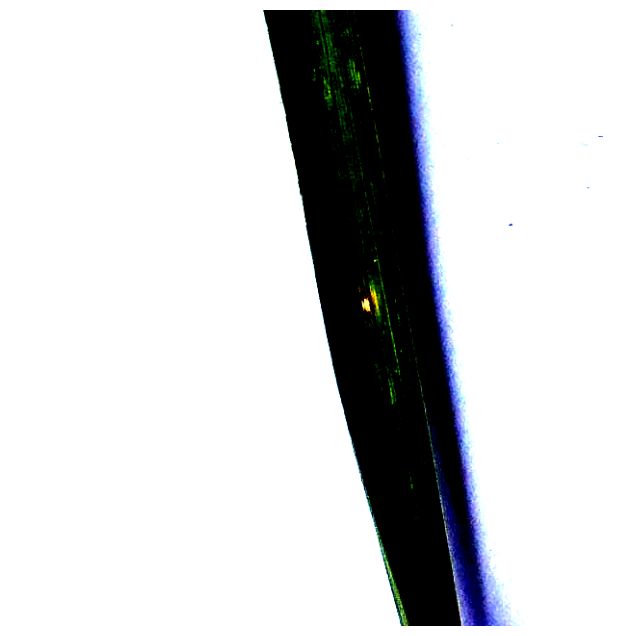

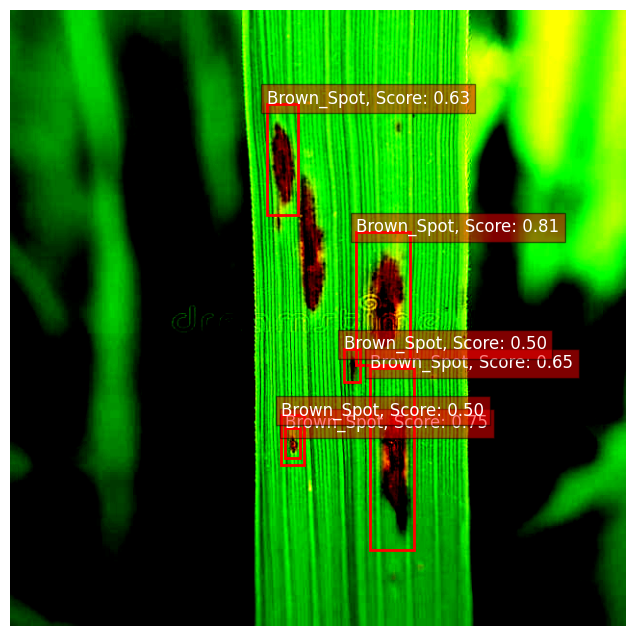

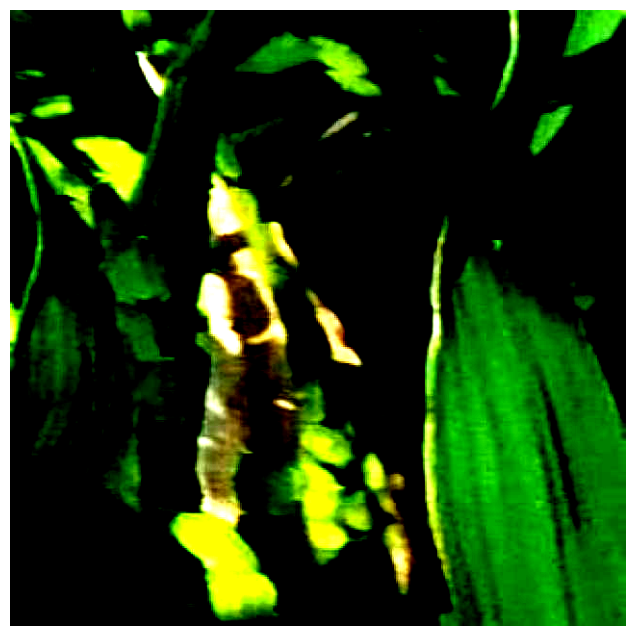

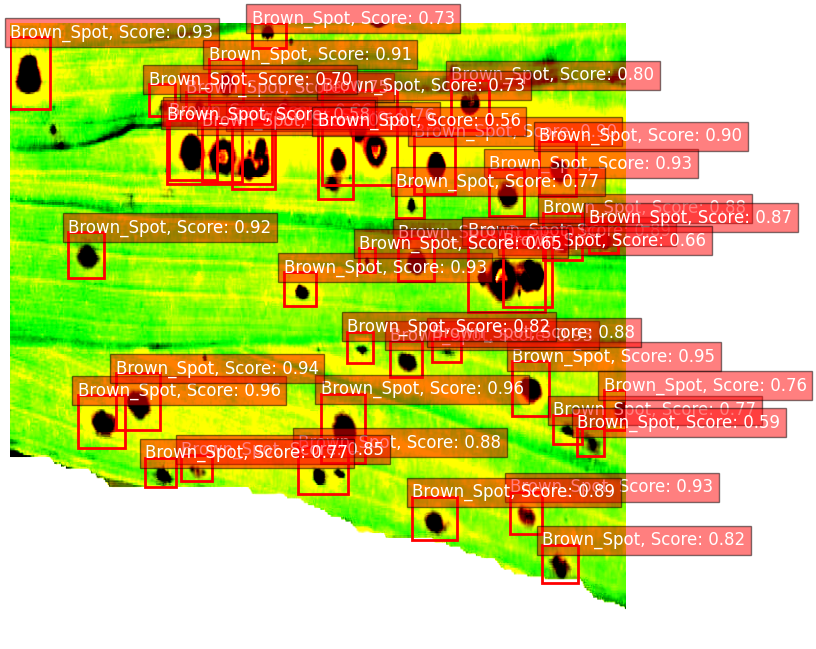

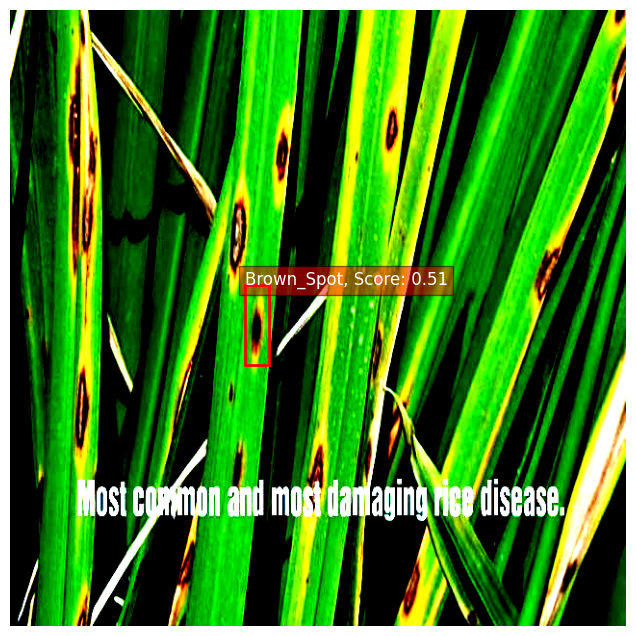

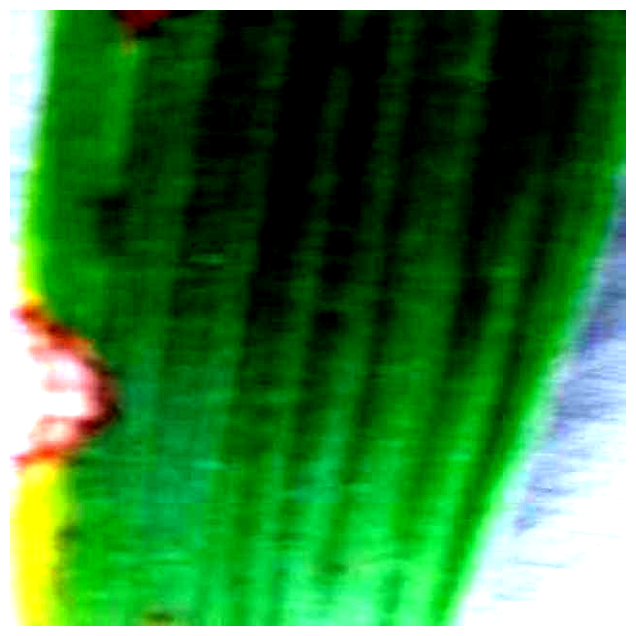

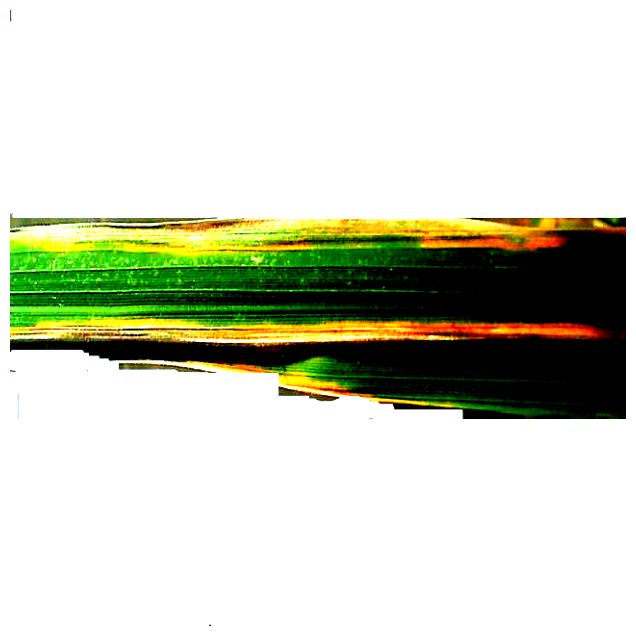

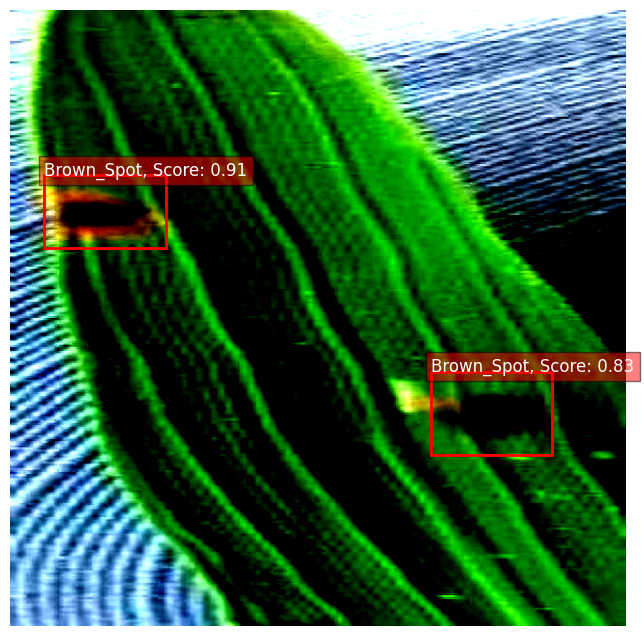

In [ ]:
import torch
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
class_names = {0: 'leaf', 1: 'Bacterial_Blight', 2: 'Brown_Spot', 3: 'Rice_Blast'}  # Update with your actual class names

# Unified function to preprocess the image (same as training preprocessing)
def preprocess_image(image, device): #added device as an argument
    if isinstance(image, torch.Tensor):
        return image  # If it's already a tensor, return it
    transform = T.Compose([
        T.Resize((640, 640)),  # Resize to 640x640 (same as training)
        T.ToTensor(),  # Convert image to tensor
        T.Normalize(mean=[0.485, 0.456, 0.406],  # Normalize using ImageNet mean
                    std=[0.229, 0.224, 0.225])  # Normalize using ImageNet std
    ])
    return transform(image).to(device) #move tensor to the device

# Function to visualize predictions
def visualize_predictions(images, predictions, class_names, num_samples=8):
    for i in range(num_samples):
        # Get the original image
        image = images[i].permute(1, 2, 0).cpu().numpy()  # Convert to HWC format

        # Draw predicted boxes
        boxes = predictions[i]['boxes'].cpu().detach().numpy()  # Use detach to avoid tracking gradients
        labels = predictions[i]['labels'].cpu().detach().numpy()
        scores = predictions[i]['scores'].cpu().detach().numpy()

        # Display the image
        plt.figure(figsize=(12, 8))
        plt.imshow(image)

        for box, label, score in zip(boxes, labels, scores):
            if score > 0.5:  # Show boxes with a score above a certain threshold
                x_min, y_min, x_max, y_max = box  # Adjust based on your box format
                rect = plt.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min,
                                     fill=False, color='red', linewidth=2)
                plt.gca().add_patch(rect)
                # Replace label with class name
                class_name = class_names[int(label)]
                plt.text(x_min, y_min, f'{class_name}, Score: {score:.2f}',
                         color='white', fontsize=12, bbox=dict(facecolor='red', alpha=0.5))

        plt.axis('off')
        plt.show()

# Function to evaluate and get predictions from the model
def get_predictions(model, data_loader, device):
    model.eval()
    all_images = []
    all_predictions = []

    with torch.no_grad():
        for images, _ in data_loader:  # Get only images, ignore targets
            # Preprocess and send to device here
            images = [preprocess_image(img, device) for img in images]
            predictions = model(images)  # Forward pass
            all_images.extend(images)
            all_predictions.extend(predictions)

    return all_images, all_predictions

# Load the Faster R-CNN model
model_path = '/content/faster_rcnn_resnet.pt'
model = torch.load(model_path)  # Directly load the model
model.eval()

# Set device (CPU or CUDA)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Get predictions
all_images, all_predictions = get_predictions(model, test_loader, device)

# Visualize the results
visualize_predictions(all_images, all_predictions, class_names, num_samples=8)

# **Faster RCNN with testing**

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="2kitnnHgOjy6JbGxYUGm")
project = rf.workspace("harsha-etczl").project("ninja-ovs6e")
version = project.version(1)
dataset = version.download("coco")


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.9/80.9 kB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 4.9 MB/s eta 0:00:00
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Ninja-1 in coco:: 100%|██████████| 381/381 [00:00<00:00, 2670.13it/s]


In [ ]:
import os
import json
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw
import collections
import torch
import torchvision
from torchvision.models.detection import FasterRCNN, fasterrcnn_mobilenet_v3_large_fpn
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision import transforms as T
from torch.utils.data import DataLoader
from tqdm import tqdm

# Define the path to the base directory where train, valid, test folders are stored
base_dir = '/content/Ninja-1'

# Folders to check
folders = ['train', 'valid', 'test']

# Initialize categories to keep track of categories across all datasets
all_categories = {}
coco_data = {}

# Function to load and check annotation files
def check_annotations(folder_name):
    annotation_file = os.path.join(base_dir, folder_name, '_annotations.coco.json')

    if os.path.exists(annotation_file):
        print(f"\nChecking annotations for the {folder_name} folder:")
        with open(annotation_file, 'r') as f:
            coco_data[folder_name] = json.load(f)

        # Print an overview of the annotations
        print("Categories: ", coco_data[folder_name].get('categories', 'No categories found'))
        print("Number of Images: ", len(coco_data[folder_name].get('images', [])))
        print("Number of Annotations: ", len(coco_data[folder_name].get('annotations', [])))

        # Add categories to the global dictionary
        for category in coco_data[folder_name]['categories']:
            all_categories[category['id']] = category['name']

        # Check if 'image_id', 'category_id', and 'bbox' fields are present in annotations
        if coco_data[folder_name].get('annotations'):
            for annotation in coco_data[folder_name]['annotations'][:5]:  # Print first 5 annotations as a sample
                print("Annotation example: ", annotation)
                assert 'image_id' in annotation, "Missing 'image_id' in annotation"
                assert 'category_id' in annotation, "Missing 'category_id' in annotation"
                assert 'bbox' in annotation, "Missing 'bbox' in annotation"
        else:
            print(f"No annotations found in {folder_name}!")
    else:
        print(f"Annotation file not found in {folder_name} folder")

# Check annotations for all folders: train, valid, test
for folder in folders:
    check_annotations(folder)


Checking annotations for the train folder:
Categories:  [{'id': 0, 'name': 'leaf', 'supercategory': 'none'}, {'id': 1, 'name': 'Bacterial_Blight', 'supercategory': 'leaf'}, {'id': 2, 'name': 'Brown_Spot', 'supercategory': 'leaf'}, {'id': 3, 'name': 'Rice_Blast', 'supercategory': 'leaf'}]
Number of Images:  261
Number of Annotations:  1041
Annotation example:  {'id': 0, 'image_id': 0, 'category_id': 2, 'bbox': [301, 107, 175, 151.5], 'area': 26512.5, 'segmentation': [], 'iscrowd': 0}
Annotation example:  {'id': 1, 'image_id': 1, 'category_id': 3, 'bbox': [126, 9, 81, 83], 'area': 6723, 'segmentation': [], 'iscrowd': 0}
Annotation example:  {'id': 2, 'image_id': 1, 'category_id': 3, 'bbox': [143, 275, 89.5, 104.5], 'area': 9352.75, 'segmentation': [], 'iscrowd': 0}
Annotation example:  {'id': 3, 'image_id': 1, 'category_id': 3, 'bbox': [132, 410, 53.5, 49], 'area': 2621.5, 'segmentation': [], 'iscrowd': 0}
Annotation example:  {'id': 4, 'image_id': 1, 'category_id': 3, 'bbox': [139, 559

In [ ]:
# Extract category names from the aggregated categories
print("\nAll Disease categories across datasets: ", all_categories)


All Disease categories across datasets:  {0: 'leaf', 1: 'Bacterial_Blight', 2: 'Brown_Spot', 3: 'Rice_Blast'}


In [ ]:
# Transformation
transform = T.Compose([
    T.Resize((640, 640)),
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Load datasets using COCO format with MobileNet v3 Large FPN
train_dataset = torchvision.datasets.CocoDetection(root=os.path.join(base_dir, 'train'),
                                                  annFile=os.path.join(base_dir, 'train', '_annotations.coco.json'),
                                                  transform=transform)

valid_dataset = torchvision.datasets.CocoDetection(root=os.path.join(base_dir, 'valid'),
                                                 annFile=os.path.join(base_dir, 'valid', '_annotations.coco.json'),
                                                 transform=transform)
# Create DataLoaders
train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True, collate_fn=lambda x: tuple(zip(*x)))
valid_loader = DataLoader(valid_dataset, batch_size=4, shuffle=False, collate_fn=lambda x: tuple(zip(*x)))

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


In [ ]:
# Import necessary libraries
from torchvision.models.detection import fasterrcnn_resnet50_fpn
import torch.optim as optim
from tqdm import tqdm
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection import FasterRCNN

# Modify the number of classes (7 classes including background)
num_classes = 4  # 6 classes + 1 background class

# Load pretrained Faster R-CNN model
model = fasterrcnn_resnet50_fpn(weights='FasterRCNN_ResNet50_FPN_Weights.DEFAULT')

# Modify the classifier for the correct number of classes
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

# Freeze early layers (e.g., first few layers of the backbone)
for param in model.backbone.body.conv1.parameters():
    param.requires_grad = False
for param in model.backbone.body.layer1.parameters():
    param.requires_grad = False

# Adjusting FPN layers to use only the first two blocks (if needed)
# Freeze the first two inner_blocks and layer_blocks in the FPN
for param in model.backbone.fpn.inner_blocks[:2]:
    for p in param.parameters():
        p.requires_grad = False

for param in model.backbone.fpn.layer_blocks[:2]:
    for p in param.parameters():
        p.requires_grad = False

# Modify the RPN by reducing the number of proposals (e.g., number of anchors)
model.rpn.head.num_anchors = 6
model.rpn.nms_thresh = 0.6  # Adjust Non-Maximum Suppression threshold (0.6 is a good starting point)

# Move model to GPU if available
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
model.to(device)

Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth
100%|██████████| 160M/160M [00:01<00:00, 160MB/s]


FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

In [ ]:
import torch
import torch.optim as optim
from tqdm import tqdm


# Set the number of epochs
num_epochs = 10

#  Optimizer and Scheduler
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.001, momentum=0.9, weight_decay=0.0005)
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.1)

def prepare_targets(targets):
    formatted_targets = []
    for t in targets:
        if len(t) == 0:
            print("No annotations for this image, skipping...")
            continue

        # Extract bounding boxes and check for validity
        boxes = torch.tensor([ann['bbox'] for ann in t if 'bbox' in ann], dtype=torch.float32)
        if boxes.size(0) == 0:
            print("No valid bounding boxes found for this image, skipping...")
            continue

        # Convert [x, y, width, height] -> [x_min, y_min, x_max, y_max]
        boxes[:, 2:] += boxes[:, :2]

        # Filter out invalid boxes (e.g., negative or zero-size)
        valid_boxes = []
        valid_labels = []
        for i, box in enumerate(boxes):
            x_min, y_min, x_max, y_max = box
            if (x_max > x_min) and (y_max > y_min):
                valid_boxes.append(box)
                valid_labels.append(t[i]['category_id'])
            else:
                print(f"Invalid bounding box removed: {box.tolist()}")

        if valid_boxes:
            formatted_target = {
                'boxes': torch.stack(valid_boxes),
                'labels': torch.tensor(valid_labels, dtype=torch.int64)
            }
            formatted_targets.append(formatted_target)
        else:
            print("No valid bounding boxes for this image, skipping...")

    return formatted_targets

# Debugging during DataLoader creation
def print_sample_annotations(dataset):
    for idx in range(5):  # Print the first 5 images for debugging
        img, annotations = dataset[idx]
        print(f"Image {idx} - Number of annotations: {len(annotations)}")
        for ann in annotations:
            print(f"  Annotation: {ann}")

print("Sample annotations from training dataset:")
print_sample_annotations(train_dataset)

Sample annotations from training dataset:
Image 0 - Number of annotations: 1
  Annotation: {'id': 0, 'image_id': 0, 'category_id': 2, 'bbox': [301, 107, 175, 151.5], 'area': 26512.5, 'segmentation': [], 'iscrowd': 0}
Image 1 - Number of annotations: 18
  Annotation: {'id': 1, 'image_id': 1, 'category_id': 3, 'bbox': [126, 9, 81, 83], 'area': 6723, 'segmentation': [], 'iscrowd': 0}
  Annotation: {'id': 2, 'image_id': 1, 'category_id': 3, 'bbox': [143, 275, 89.5, 104.5], 'area': 9352.75, 'segmentation': [], 'iscrowd': 0}
  Annotation: {'id': 3, 'image_id': 1, 'category_id': 3, 'bbox': [132, 410, 53.5, 49], 'area': 2621.5, 'segmentation': [], 'iscrowd': 0}
  Annotation: {'id': 4, 'image_id': 1, 'category_id': 3, 'bbox': [139, 559, 55.5, 79], 'area': 4384.5, 'segmentation': [], 'iscrowd': 0}
  Annotation: {'id': 5, 'image_id': 1, 'category_id': 3, 'bbox': [2, 431, 64, 117.5], 'area': 7520, 'segmentation': [], 'iscrowd': 0}
  Annotation: {'id': 6, 'image_id': 1, 'category_id': 3, 'bbox': [2

In [ ]:
def train_one_epoch(model, optimizer, train_loader, device, epoch):
    model.train()
    running_loss = 0.0
    progress_bar = tqdm(train_loader, desc=f"Training Epoch {epoch+1}")
    for images, targets in progress_bar:
        images = [image.to(device) for image in images]
        targets = prepare_targets(targets)
        if not targets:
            continue
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
        if len(images)!= len(targets):
            continue
        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())
        running_loss += losses.item()
        optimizer.zero_grad()
        losses.backward()
        optimizer.step()
        progress_bar.set_postfix(loss=running_loss / len(progress_bar))
    return running_loss / len(train_loader)

def evaluate(model, valid_loader, device):
    model.eval()
    running_loss = 0.0
    with torch.no_grad():
        for images, targets in tqdm(valid_loader, desc="Validating"):
            images = [image.to(device) for image in images]
            targets = prepare_targets(targets)
            if not targets:
                continue
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
            if len(images)!= len(targets):
                continue
            loss_dict = model(images, targets)
            losses = sum(loss for loss in loss_dict.values())
            running_loss += losses.item()
    return running_loss / len(valid_loader)

def train_model(model, train_loader, num_epochs, optimizer, scheduler, device):
    for epoch in range(num_epochs):
        train_loss = train_one_epoch(model, optimizer, train_loader, device, epoch)
        print(f"Epoch {epoch+1}, Loss: {train_loss}")
        scheduler.step()

# Train the model
num_epochs = 10
train_model(model, train_loader, num_epochs, optimizer, lr_scheduler, device)

Training Epoch 1: 100%|██████████| 66/66 [00:48<00:00,  1.37it/s, loss=0.499]


Epoch 1, Loss: 0.4989637549627911


Training Epoch 2: 100%|██████████| 66/66 [00:46<00:00,  1.41it/s, loss=0.348]


Epoch 2, Loss: 0.3476257442750714


Training Epoch 3: 100%|██████████| 66/66 [00:47<00:00,  1.40it/s, loss=0.312]


Epoch 3, Loss: 0.31204567860924837


Training Epoch 4: 100%|██████████| 66/66 [00:47<00:00,  1.40it/s, loss=0.293]


Epoch 4, Loss: 0.29255021544116916


Training Epoch 5: 100%|██████████| 66/66 [00:47<00:00,  1.40it/s, loss=0.289]


Epoch 5, Loss: 0.2885543172332374


Training Epoch 6: 100%|██████████| 66/66 [00:47<00:00,  1.40it/s, loss=0.285]


Epoch 6, Loss: 0.2851648825136098


Training Epoch 7: 100%|██████████| 66/66 [00:47<00:00,  1.40it/s, loss=0.285]


Epoch 7, Loss: 0.2848398783667521


Training Epoch 8: 100%|██████████| 66/66 [00:47<00:00,  1.40it/s, loss=0.282]


Epoch 8, Loss: 0.2819715216755867


Training Epoch 9: 100%|██████████| 66/66 [00:47<00:00,  1.40it/s, loss=0.281]


Epoch 9, Loss: 0.2811145948415453


Training Epoch 10: 100%|██████████| 66/66 [00:47<00:00,  1.40it/s, loss=0.29]

Epoch 10, Loss: 0.29024344524650864


In [ ]:
# Load test dataset using COCO format
from torchvision.datasets import CocoDetection

test_dataset = CocoDetection(root=os.path.join(base_dir, 'test'),
                             annFile=os.path.join(base_dir, 'test', '_annotations.coco.json'),
                             transform=transform)

# Create DataLoader for the test set
test_loader = DataLoader(test_dataset, batch_size=4, shuffle=False, collate_fn=lambda x: tuple(zip(*x)))


loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


In [ ]:
from torchvision.ops import box_iou

def evaluate_on_test(model, test_loader, device):
    model.eval()  # Set model to evaluation mode
    all_boxes = []
    all_labels = []
    all_scores = []

    with torch.no_grad():  # Disable gradient calculations for evaluation
        for images, targets in tqdm(test_loader, desc="Evaluating"):
            images = [image.to(device) for image in images]

            # Prepare targets (fixing the structure and validating bounding boxes)
            targets = prepare_targets(targets)

            # Get predictions
            predictions = model(images)

            # Collect boxes, labels, and scores for evaluation
            for i, prediction in enumerate(predictions):
                if len(prediction['boxes']) > 0:
                    all_boxes.append(prediction['boxes'].cpu())
                    all_labels.append(prediction['labels'].cpu())
                    all_scores.append(prediction['scores'].cpu())

    return all_boxes, all_labels, all_scores

In [ ]:
import numpy as np
import torch
from sklearn.metrics import average_precision_score

def compute_map(all_boxes, all_labels, all_scores, num_classes):
    y_true = np.zeros((0, num_classes))  # Initialize empty one-hot encoded array
    y_scores = np.zeros((0, num_classes))  # Initialize empty 2D scores array

    for cls in range(num_classes):
        cls_boxes = []
        cls_scores = []
        cls_labels = []

        for boxes, labels, scores in zip(all_boxes, all_labels, all_scores):
            # Ensure labels is a NumPy array
            labels = labels.numpy() if isinstance(labels, torch.Tensor) else labels

            # Create a mask for the current class
            cls_mask = (labels == cls)
            if np.any(cls_mask):  # Ensure there are samples for this class
                cls_boxes.append(boxes[cls_mask])
                cls_scores.append(scores[cls_mask])
                cls_labels.append(labels[cls_mask])

        if cls_boxes:
            cls_boxes = torch.cat(cls_boxes)
            cls_scores = torch.cat(cls_scores)

            # Convert cls_labels to tensors before concatenation
            cls_labels = torch.cat([torch.from_numpy(l) for l in cls_labels])

            # Prepare true labels in one-hot encoding
            cls_true_labels = np.zeros((len(cls_labels), num_classes))
            cls_true_labels[:, cls] = 1  # Set the corresponding class index to 1

            # Append true labels and scores
            y_true = np.vstack((y_true, cls_true_labels))

            # Convert cls_scores to 2D array where each class has its own column
            cls_score_2d = np.zeros((len(cls_scores), num_classes))
            cls_score_2d[:, cls] = cls_scores.numpy()  # Put scores in the corresponding class column
            y_scores = np.vstack((y_scores, cls_score_2d))

    # Calculate average precision
    average_precision = average_precision_score(y_true, y_scores, average='macro')
    return average_precision

In [ ]:
# Evaluate on the test dataset
all_boxes, all_labels, all_scores = evaluate_on_test(model, test_loader, device)

# Compute mAP
map_score = compute_map(all_boxes, all_labels, all_scores, num_classes)
print(f"Mean Average Precision (mAP) on the test dataset: {map_score:.4f}")

Evaluating: 100%|██████████| 10/10 [00:03<00:00,  2.86it/s]Mean Average Precision (mAP) on the test dataset: 0.7724


In [ ]:
import os
import torch
import numpy as np
from torchvision.datasets import CocoDetection
from torch.utils.data import DataLoader
import torchvision.transforms as T

# Unified function to preprocess the image (same as training preprocessing)
def preprocess_image(image):
    if isinstance(image, torch.Tensor):
        return image  # If it's already a tensor, return it
    transform = T.Compose([
        T.Resize((640, 640)),  # Resize to 640x640 (same as training)
        T.ToTensor(),  # Convert image to tensor
        T.Normalize(mean=[0.485, 0.456, 0.406],  # Normalize using ImageNet mean
                    std=[0.229, 0.224, 0.225])  # Normalize using ImageNet std
    ])
    return transform(image)

# Function to compute Precision and Recall based on predicted class labels
def evaluate_precision_recall_on_dataset(model, test_loader, device, conf_threshold=0.7):
    # Initialize counts
    tp = 0  # True Positives
    fp = 0  # False Positives
    fn = 0  # False Negatives

    model.eval()  # Set model to evaluation mode

    with torch.no_grad():
        for images, annotations in test_loader:
            # Preprocess images and send to device
            images = [preprocess_image(image).to(device) for image in images]

            # Get predictions from the model
            predictions = model(images)

            # Loop over each image in the batch
            for i, prediction in enumerate(predictions):
                predicted_labels = prediction['labels'].cpu().numpy()  # Predicted class labels
                predicted_scores = prediction['scores'].cpu().numpy()  # Prediction confidence scores

                # Apply confidence threshold
                predicted_labels = predicted_labels[predicted_scores >= conf_threshold]

                gt_labels = np.array([ann['category_id'] for ann in annotations[i]])  # Ground truth labels

                # Compute TP, FP, FN based on class labels
                for pred_label in predicted_labels:
                    if pred_label in gt_labels:
                        tp += 1  # Correct class prediction
                    else:
                        fp += 1  # Incorrect class prediction

                # FN: Ground truth labels not detected by the model
                fn += len(gt_labels) - sum([1 for gt_label in gt_labels if gt_label in predicted_labels])

    # Calculate precision and recall
    precision = tp / (tp + fp) if (tp + fp) > 0 else 0.0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 0.0

    return precision, recall

# Load test dataset using COCO format
base_dir = '/content/Ninja-1'
test_dataset = CocoDetection(root=os.path.join(base_dir, 'test'),
                             annFile=os.path.join(base_dir, 'test', '_annotations.coco.json'))

# Create DataLoader for test dataset
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False, collate_fn=lambda x: tuple(zip(*x)))
# Set device (CPU or CUDA)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Adjust confidence threshold as needed
confidence_threshold = 0.5

# Evaluate the model on the test dataset for Precision and Recall
precision, recall = evaluate_precision_recall_on_dataset(model, test_loader, device, conf_threshold=confidence_threshold)

# Convert to percentages
precision_percentage = precision * 100
recall_percentage = recall * 100

print(f"Precision (P%): {precision_percentage:.2f}%")
print(f"Recall (R%): {recall_percentage:.2f}%")

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
Precision (P%): 90.00%
Recall (R%): 68.42%


In [ ]:
torch.save(model, 'faster_rcnn_resnet_custom.pt')

In [ ]:
model = torch.load('faster_rcnn_resnet_custom.pt')
model.eval()


You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

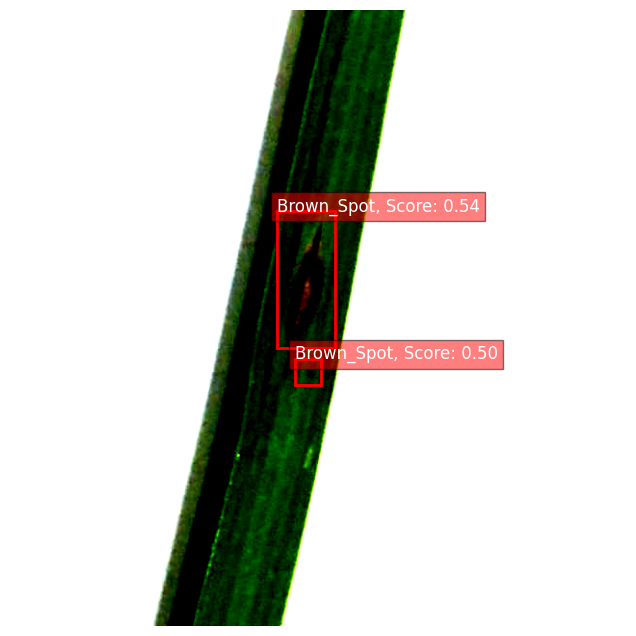

In [ ]:
import matplotlib.pyplot as plt

import torch
from PIL import Image
import torchvision.transforms as T
class_names = {0: 'leaf', 1: 'Bacterial_Blight', 2: 'Brown_Spot', 3: 'Rice_Blast'}  # Update with your actual class names

# Function to preprocess the image
def preprocess_image(image_path, device):
    # Define the transformation for the input image (Resize, Normalize, etc.)
    transform = T.Compose([
        T.Resize((640, 640)),  # Resize to 640x640
        T.ToTensor(),  # Convert image to tensor
        T.Normalize(mean=[0.485, 0.456, 0.406],  # Normalize using ImageNet mean
                    std=[0.229, 0.224, 0.225])  # Normalize using ImageNet std
    ])

    # Load the image using PIL
    image = Image.open(image_path).convert("RGB")

    # Apply transformations
    image_tensor = transform(image).unsqueeze(0).to(device)  # Add batch dimension and move to device
    return image_tensor, image


# Function to visualize the prediction on a user-provided image
def visualize_user_image(image, predictions, class_names):
    # Convert tensor image to numpy array for visualization
    image_np = image.permute(1, 2, 0).cpu().numpy()  # Convert to HWC format

    # Draw predicted boxes
    boxes = predictions[0]['boxes'].cpu().detach().numpy()  # Use detach to avoid tracking gradients
    labels = predictions[0]['labels'].cpu().detach().numpy()
    scores = predictions[0]['scores'].cpu().detach().numpy()

    # Display the image
    plt.figure(figsize=(12, 8))
    plt.imshow(image_np)

    for box, label, score in zip(boxes, labels, scores):
        if score > 0.5:  # Show boxes with a score above a certain threshold
            x_min, y_min, x_max, y_max = box  # Adjust based on your box format
            rect = plt.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min,
                                 fill=False, color='red', linewidth=2)
            plt.gca().add_patch(rect)
            # Replace label with class name
            class_name = class_names[int(label)]
            plt.text(x_min, y_min, f'{class_name}, Score: {score:.2f}',
                     color='white', fontsize=12, bbox=dict(facecolor='red', alpha=0.5))

    plt.axis('off')
    plt.show()

# Function to perform prediction on a user-provided image
def predict_on_user_image(model, image_path, device, class_names):
    # Preprocess the image
    image_tensor, original_image = preprocess_image(image_path, device)

    # Set the model to evaluation mode
    model.eval()

    # Run the model on the input image
    with torch.no_grad():
        # Remove the extra brackets to pass the 4D tensor directly
        predictions = model(image_tensor)

    # Visualize the results
    visualize_user_image(image_tensor[0], predictions, class_names)

# Example usage:
# Let's say the user provides an image file named 'test_image.jpg'
image_path = '/content/Ninja-1/train/IMG_5499_jpg.rf.064e0501d947ce47967f2eca6076bceb.jpg'  # Replace with the actual image path
predict_on_user_image(model, image_path, device, class_names)


## Eigen Cam

In [ ]:
!pip install torchcam
!pip install grad-cam
!pip install pycocotools
!pip install git+https://github.com/jacobgil/pytorch-grad-cam.git

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 2.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 61.7 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for grad-cam: filename=grad_cam-1.5.4-py3-none-any.whl size=39587 sha256=0db3fa4d7baac786000259afc71b632c7c38ba6c7e4b149e98f8354072f22ed2
  Stored in directory: /root/.cache/pip/wheels/50/b0/82/1f97b5348c7fe9f0ce0ba18497202cafa5dec4562bd5292680
Successfully built grad-cam
  Cloning https://github.com/jacobgil/pytorch-grad-cam.git to /tmp/pip-req-build-7vym251y
  Running command git clone --filter=blob:none --quiet https://github.com/jacobgil/pytorch-grad-cam.git /tmp/pip-req-build-7vym251y
  Resolved https://github.com/jacobgil/pytorch-grad-cam.git to commit ded280ccd2c4987d3c76a9ecd0994a8ec48fdc55
  Installing build dependencies ... done
  Getting requirements to build wheel ... don

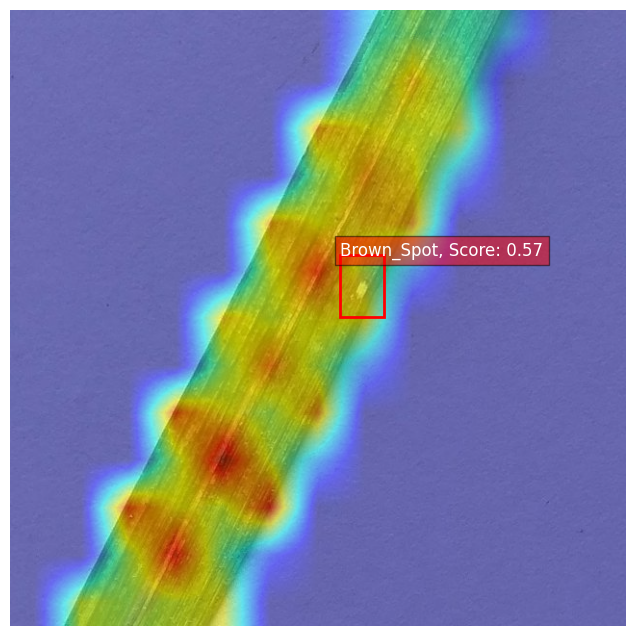

In [ ]:
import matplotlib.pyplot as plt
import torch
import numpy as np
from PIL import Image
import torchvision.transforms as T
from pytorch_grad_cam import EigenCAM
from pytorch_grad_cam.utils.model_targets import FasterRCNNBoxScoreTarget
from pytorch_grad_cam.utils.reshape_transforms import fasterrcnn_reshape_transform
from pytorch_grad_cam.utils.image import show_cam_on_image

# Define the class names
class_name = {0: 'leafs', 1: 'Bacterial_Blight', 2: 'Brown_Spot', 3: 'Rice_Blast'}

# Function to preprocess the image
def preprocess_image(image_path, device):
    transform = T.Compose([
        T.Resize((640, 640)),
        T.ToTensor(),
        T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    image = Image.open(image_path).convert("RGB")
    image_tensor = transform(image).unsqueeze(0).to(device)
    return image_tensor, image

# Function to visualize the image with predictions and CAM overlay
def visualize_user_image(image, predictions, class_names, cam_image=None):
    image_np = image.permute(1, 2, 0).cpu().numpy()
    boxes = predictions[0]['boxes'].cpu().detach().numpy()
    labels = predictions[0]['labels'].cpu().detach().numpy()
    scores = predictions[0]['scores'].cpu().detach().numpy()

    plt.figure(figsize=(12, 8))
    plt.imshow(image_np if cam_image is None else cam_image)

    for box, label, score in zip(boxes, labels, scores):
        if score > 0.5:
            x_min, y_min, x_max, y_max = box
            rect = plt.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min,
                                 fill=False, color='red', linewidth=2)
            plt.gca().add_patch(rect)
            class_name = class_names[int(label)]
            plt.text(x_min, y_min, f'{class_name}, Score: {score:.2f}',
                     color='white', fontsize=12, bbox=dict(facecolor='red', alpha=0.5))

    plt.axis('off')
    plt.show()

# Function to perform prediction and apply EigenCAM
def predict_with_cam(model, image_path, device, class_names):
    image_tensor, original_image = preprocess_image(image_path, device)

    model.eval()
    with torch.no_grad():
        predictions = model(image_tensor)

    # Apply EigenCAM
    target_layers = [model.backbone]  # Backbone as target layer
    targets = [FasterRCNNBoxScoreTarget(labels=predictions[0]['labels'],
                                        bounding_boxes=predictions[0]['boxes'])]

    # Initialize EigenCAM without 'use_cuda' argument
    cam = EigenCAM(model=model, target_layers=target_layers, reshape_transform=fasterrcnn_reshape_transform)

    grayscale_cam = cam(input_tensor=image_tensor, targets=targets)
    grayscale_cam = grayscale_cam[0, :]  # Take the first image from batch

    # Convert image to float numpy array for overlay
    image_float_np = original_image.resize((640, 640))  # Resize for consistency
    image_float_np = np.array(image_float_np) / 255.0  # Normalize to [0, 1]

    # Overlay CAM on original image
    cam_image = show_cam_on_image(image_float_np, grayscale_cam, use_rgb=True)

    # Visualize the image with bounding boxes and CAM
    visualize_user_image(image_tensor[0], predictions, class_names, cam_image=cam_image)

# Load the Faster R-CNN model
model_path = '/content/faster_rcnn_resnet_custom.pt'

# Load model to CPU if CUDA is not available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = torch.load(model_path, map_location=device)
model.eval()


# Example usage:
image_path = '/content/IMG_20190419_140253_jpg.rf.9d587ef1b880d7825593d76070d64080.jpg'  # Replace with the actual image path
predict_with_cam(model, image_path, device, class_name)


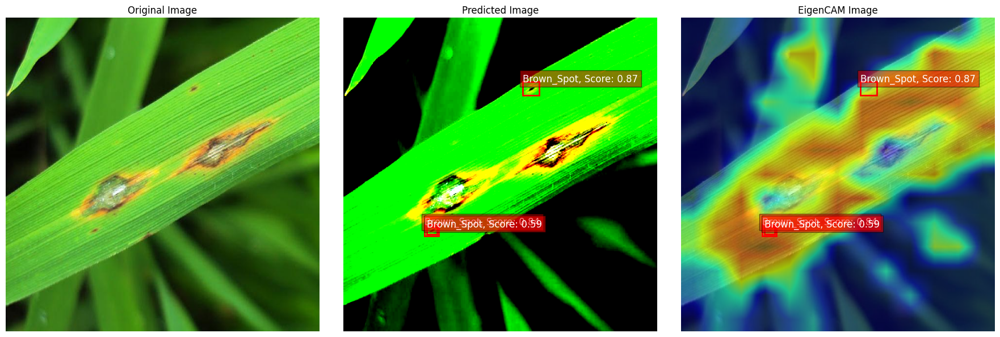

In [ ]:
import matplotlib.pyplot as plt
import torch
import numpy as np
from PIL import Image
import torchvision.transforms as T
from pytorch_grad_cam import EigenCAM
from pytorch_grad_cam.utils.model_targets import FasterRCNNBoxScoreTarget
from pytorch_grad_cam.utils.reshape_transforms import fasterrcnn_reshape_transform
from pytorch_grad_cam.utils.image import show_cam_on_image

# Define the class names
class_name = {0: 'leafs', 1: 'Bacterial_Blight', 2: 'Brown_Spot', 3: 'Rice_Blast'}

# Unified function to preprocess the image
def preprocess_image(image_path, device):
    # Define the transformation for the input image (Resize, Normalize, etc.)
    transform = T.Compose([
        T.Resize((640, 640)),  # Resize to 640x640
        T.ToTensor(),  # Convert image to tensor
        T.Normalize(mean=[0.485, 0.456, 0.406],  # Normalize using ImageNet mean
                    std=[0.229, 0.224, 0.225])  # Normalize using ImageNet std
    ])

    # Load the image using PIL
    image = Image.open(image_path).convert("RGB")

    # Apply transformations
    image_tensor = transform(image).unsqueeze(0).to(device)  # Add batch dimension and move to device
    return image_tensor, image

# Function to draw bounding boxes on an image
def draw_boxes(ax, boxes, labels, scores, class_names):
    for box, label, score in zip(boxes, labels, scores):
        if score > 0.5:  # Show boxes with a score above a certain threshold
            x_min, y_min, x_max, y_max = box  # Adjust based on your box format
            rect = plt.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min,
                                 fill=False, color='red', linewidth=2)
            ax.add_patch(rect)  # Draw the bounding box
            class_name = class_names[int(label)]
            ax.text(x_min, y_min, f'{class_name}, Score: {score:.2f}',
                    color='white', fontsize=12, bbox=dict(facecolor='red', alpha=0.5))

# Function to visualize the original image, predicted image, and CAM overlay side by side
def visualize_side_by_side(original_image, image_tensor, predictions, class_names, cam_image):
    # Convert tensor image to numpy array for visualization
    image_np = image_tensor.permute(1, 2, 0).cpu().numpy()  # Convert to HWC format
    image_np = np.clip(image_np, 0, 1)  # Clip the values between 0 and 1 for valid imshow range

    # Create a figure to show all images side by side
    fig, axs = plt.subplots(1, 3, figsize=(18, 6))

    # Draw predicted boxes
    boxes = predictions[0]['boxes'].cpu().detach().numpy()  # Use detach to avoid tracking gradients
    labels = predictions[0]['labels'].cpu().detach().numpy()
    scores = predictions[0]['scores'].cpu().detach().numpy()

    # Show the original image
    axs[0].imshow(np.array(original_image))
    axs[0].set_title("Original Image")
    axs[0].axis('off')

    # Show the predicted image
    axs[1].imshow(image_np)
    axs[1].set_title("Predicted Image")
    draw_boxes(axs[1], boxes, labels, scores, class_names)
    axs[1].axis('off')

    # Show the CAM overlay image
    axs[2].imshow(cam_image)
    axs[2].set_title("EigenCAM Image")
    draw_boxes(axs[2], boxes, labels, scores, class_names)  # Add boxes on the EigenCAM image
    axs[2].axis('off')

    # Display the images
    plt.tight_layout()
    plt.show()

# Function to perform prediction and apply EigenCAM
def predict_with_cam(model, image_path, device, class_names):
    # Preprocess the image using the unified function
    image_tensor, original_image = preprocess_image(image_path, device)

    # Set the model to evaluation mode
    model.eval()

    # Run the model on the input image
    with torch.no_grad():
        predictions = model(image_tensor)

    # Apply EigenCAM
    target_layers = [model.backbone]  # Backbone as target layer
    targets = [FasterRCNNBoxScoreTarget(labels=predictions[0]['labels'],
                                        bounding_boxes=predictions[0]['boxes'])]

    # Initialize EigenCAM
    cam = EigenCAM(model=model, target_layers=target_layers, reshape_transform=fasterrcnn_reshape_transform)

    grayscale_cam = cam(input_tensor=image_tensor, targets=targets)
    grayscale_cam = grayscale_cam[0, :]  # Take the first image from batch

    # Convert the original image to a float numpy array for overlay
    image_float_np = original_image.resize((640, 640))  # Resize for consistency
    image_float_np = np.array(image_float_np) / 255.0  # Normalize to [0, 1]

    # Overlay CAM on the original image
    cam_image = show_cam_on_image(image_float_np, grayscale_cam, use_rgb=True)

    # Visualize the original image, predicted image, and CAM side by side
    visualize_side_by_side(original_image, image_tensor[0], predictions, class_names, cam_image)

# Load the Faster R-CNN model
model_path = '/content/faster_rcnn_resnet_custom.pt'
model = torch.load(model_path, map_location=torch.device('cpu'))  # Load the model

# Set device (CPU or CUDA)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Example usage:
image_path = '/content/rice-blast-11_jpg.rf.1122c61c1a9e563fc70871599b87a03f.jpg'  # Replace with the actual image path
predict_with_cam(model, image_path, device, class_name)


loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


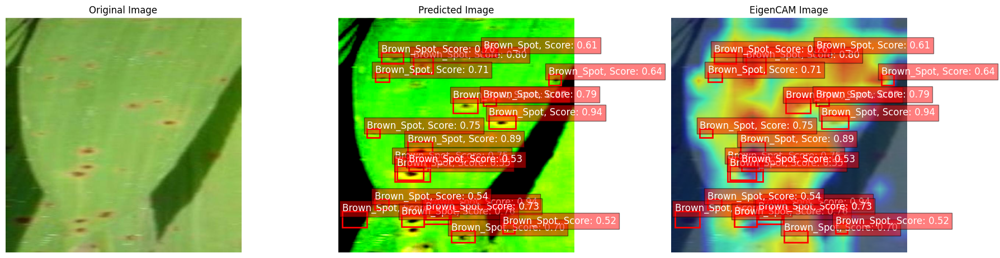

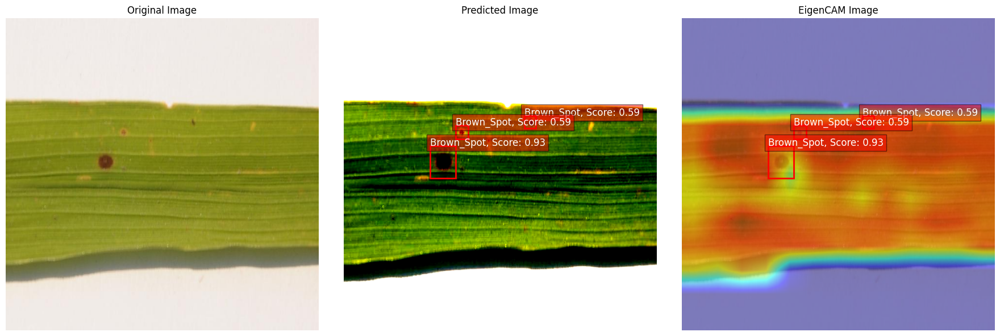

In [ ]:
import os
import random
import matplotlib.pyplot as plt
import torch
import numpy as np
from PIL import Image
import torchvision.transforms as T
# Import CocoDetection from torchvision.datasets
from torchvision.datasets import CocoDetection
from torch.utils.data import DataLoader
from pytorch_grad_cam import EigenCAM
from pytorch_grad_cam.utils.model_targets import FasterRCNNBoxScoreTarget
from pytorch_grad_cam.utils.reshape_transforms import fasterrcnn_reshape_transform
from pytorch_grad_cam.utils.image import show_cam_on_image


# Define the class names
class_name = {0: 'leafs', 1: 'Bacterial_Blight', 2: 'Brown_Spot', 3: 'Rice_Blast'}

# Unified function to preprocess the image
def preprocess_image(image, device):
    # Define the transformation for the input image (Resize to 640x640 to match CAM size)
    transform = T.Compose([
        T.Resize((640, 640)),  # Resize to 640x640 to ensure consistent dimensions
        T.ToTensor(),  # Convert image to tensor
        T.Normalize(mean=[0.485, 0.456, 0.406],  # Normalize using ImageNet mean
                    std=[0.229, 0.224, 0.225])  # Normalize using ImageNet std
    ])

    # Apply transformations
    image_tensor = transform(image).unsqueeze(0).to(device)  # Add batch dimension and move to device
    return image_tensor, image.resize((640, 640))  # Resize the original image for overlay



# Function to draw bounding boxes on an image
def draw_boxes(ax, boxes, labels, scores, class_names):
    for box, label, score in zip(boxes, labels, scores):
        if score > 0.5:  # Show boxes with a score above a certain threshold
            x_min, y_min, x_max, y_max = box  # Adjust based on your box format
            rect = plt.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min,
                                 fill=False, color='red', linewidth=2)
            ax.add_patch(rect)  # Draw the bounding box
            class_name = class_names[int(label)]
            ax.text(x_min, y_min, f'{class_name}, Score: {score:.2f}',
                    color='white', fontsize=12, bbox=dict(facecolor='red', alpha=0.5))

# Function to visualize the original image, predicted image, and CAM overlay side by side
def visualize_side_by_side(original_image, image_tensor, predictions, class_names, cam_image):
    # Convert tensor image to numpy array for visualization
    image_np = image_tensor.permute(1, 2, 0).cpu().numpy()  # Convert to HWC format
    image_np = np.clip(image_np, 0, 1)  # Clip the values between 0 and 1 for valid imshow range

    # Create a figure to show all images side by side
    fig, axs = plt.subplots(1, 3, figsize=(18, 6))

    # Draw predicted boxes
    boxes = predictions[0]['boxes'].cpu().detach().numpy()  # Use detach to avoid tracking gradients
    labels = predictions[0]['labels'].cpu().detach().numpy()
    scores = predictions[0]['scores'].cpu().detach().numpy()

    # Show the original image
    axs[0].imshow(np.array(original_image))
    axs[0].set_title("Original Image")
    axs[0].axis('off')

    # Show the predicted image
    axs[1].imshow(image_np)
    axs[1].set_title("Predicted Image")
    draw_boxes(axs[1], boxes, labels, scores, class_names)
    axs[1].axis('off')

    # Show the CAM overlay image
    axs[2].imshow(cam_image)
    axs[2].set_title("EigenCAM Image")
    draw_boxes(axs[2], boxes, labels, scores, class_names)  # Add boxes on the EigenCAM image
    axs[2].axis('off')

    # Display the images
    plt.tight_layout()
    plt.show()

# Function to perform prediction and apply EigenCAM
def predict_with_cam(model, image, device, class_names):
    # Preprocess the image using the unified function
    image_tensor, original_image = preprocess_image(image, device)

    # Set the model to evaluation mode
    model.eval()

    # Run the model on the input image
    with torch.no_grad():
        predictions = model(image_tensor)

    # Apply EigenCAM
    target_layers = [model.backbone]  # Backbone as target layer
    targets = [FasterRCNNBoxScoreTarget(labels=predictions[0]['labels'],
                                        bounding_boxes=predictions[0]['boxes'])]

    # Initialize EigenCAM
    cam = EigenCAM(model=model, target_layers=target_layers, reshape_transform=fasterrcnn_reshape_transform)

    grayscale_cam = cam(input_tensor=image_tensor, targets=targets)
    grayscale_cam = grayscale_cam[0, :]  # Take the first image from batch

    # Convert the original image to a float numpy array for overlay
    image_float_np = original_image.resize((640, 640))  # Resize for consistency
    image_float_np = np.array(image_float_np) / 255.0  # Normalize to [0, 1]

    # Overlay CAM on the original image
    # Resize the CAM heatmap to match the original image size
    from skimage.transform import resize

    # After generating the grayscale CAM
    grayscale_cam_resized = resize(grayscale_cam, (image_float_np.shape[0], image_float_np.shape[1]), anti_aliasing=True)

    # Overlay CAM on the original image
    cam_image = show_cam_on_image(image_float_np, grayscale_cam_resized, use_rgb=True)


    # Visualize the original image, predicted image, and CAM side by side
    visualize_side_by_side(original_image, image_tensor[0], predictions, class_names, cam_image)

# Load test dataset using COCO format
test_dataset = CocoDetection(root=os.path.join(base_dir, 'test'),
                             annFile=os.path.join(base_dir, 'test', '_annotations.coco.json'),
                             transform=None)  # No transformation here, do it later

random_indices = random.sample(range(len(test_dataset)), 2)

# Load the Faster R-CNN model
model_path = '/content/faster_rcnn_resnet_custom.pt'
model = torch.load(model_path, map_location=torch.device('cpu'))  # Load the model

# Set device (CPU or CUDA)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Loop over the 5 random images
for idx in random_indices:
    img, _ = test_dataset[idx]  # Get the image and its annotation
    predict_with_cam(model, img, device, class_name)
